# Genetic Risk Profiling

## Overview

The objective of this notebook is to cluster patients based on their genetic data to identify groups with similar genetic profiles.

## Dataset Information
Kaggle Dataset Link: https://www.kaggle.com/datasets/aibuzz/predict-the-genetic-disorders-datasetof-genomes/data

The dataset was curated by Amit Kumar and posted on Kaggle. It has been divided into train and test. For our case study, we will only work with the train dataset.


## Dataset Schema
| Column name                                    | Column description                                                                 |
|------------------------------------------------|-------------------------------------------------------------------------------------|
| Patient Id                                     | Represents the unique identification number of a patient                            |
| Patient Age                                    | Represents the age of a patient                                                     |
| Genes in mother's side                         | Represents a gene defect in a patient's mother                                      |
| Inherited from father                          | Represents a gene defect in a patient's father                                      |
| Maternal gene                                  | Represents a gene defect in the patient's maternal side of the family               |
| Paternal gene                                  | Represents a gene defect in a patient's paternal side of the family                 |
| Blood cell count (mcL)                         | Represents the blood cell count of a patient                                        |
| Patient First Name                             | Represents a patient's first name                                                   |
| Family Name                                    | Represents a patient's family name or surname                                       |
| Father's name                                  | Represents a patient's father's name                                                |
| Mother's age                                   | Represents a patient's mother's name                                                |
| Father's age                                   | Represents a patient's father's age                                                 |
| Institute Name                                 | Represents the medical institute where a patient was born                           |
| Location of Institute                          | Represents the location of the medical institute                                    |
| Status                                         | Represents whether a patient is deceased                                            |
| Respiratory Rate (breaths/min)                 | Represents a patient's respiratory breathing rate                                   |
| Heart Rate (rates/min)                         | Represents a patient's heart rate                                                   |
| Test 1 - Test 5                                | Represents different (masked) tests that were conducted on a patient                |
| Parental consent                               | Represents whether a patient's parents approved the treatment plan                  |
| Follow-up                                      | Represents a patient's level of risk (how intense their condition is)               |
| Gender                                         | Represents a patient's gender                                                       |
| Birth asphyxia                                 | Represents whether a patient suffered from birth asphyxia                           |
| Autopsy shows birth defect (if applicable)     | Represents whether a patient's autopsy showed any birth defects                     |
| Place of birth                                 | Represents whether a patient was born in a medical institute or home                |
| Folic acid details (peri-conceptional)         | Represents the periconceptional folic acid supplementation details of a patient     |
| H/O serious maternal illness                   | Represents an unexpected outcome of labor and delivery that resulted in significant short or long-term consequences to a patient's mother |
| H/O radiation exposure (x-ray)                 | Represents whether a patient has any radiation exposure history                     |
| H/O substance abuse                            | Represents whether a parent has a history of drug addiction                         |
| Assisted conception IVF/ART                    | Represents the type of treatment used for infertility                               |
| History of anomalies in previous pregnancies   | Represents whether the mother had any anomalies in her previous pregnancies         |
| No. of previous abortion                       | Represents the number of abortions that a mother had                                |
| Birth defects                                  | Represents whether a patient has birth defects                                      |
| White Blood cell count (thousand per microliter) | Represents a patient's white blood cell count                                      |
| Blood test result                              | Represents a patient's blood test results                                           |
| Symptom 1 - Symptom 5                          | Represents (masked) different types of symptoms that a patient had                  |
| Genetic Disorder                               | Represents the genetic disorder that a patient has                                  |
| Disorder Subclass                              | Represents the subclass of the disorder                                             |



## Libraries

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib.cm as cm
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

pd.options.display.max_colwidth = 100
pd.set_option('display.max_columns', None)

from numpy.random import seed
seed(42)

import math

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans, SpectralClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.base import clone
from sklearn.manifold import TSNE
from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel, RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

import warnings
warnings.filterwarnings('ignore')


## Data

In [3]:
df = pd.read_csv('../Data/genetic_genome/train_genetic_disorders.csv')
df.head()

,Patient Id,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),Patient First Name,Family Name,Father's name,Mother's age,Father's age,Institute Name,Location of Institute,Status,Respiratory Rate (breaths/min),Heart Rate (rates/min,Test 1,Test 2,Test 3,Test 4,Test 5,Parental consent,Follow-up,Gender,Birth asphyxia,Autopsy shows birth defect (if applicable),Place of birth,Folic acid details (peri-conceptional),H/O serious maternal illness,H/O radiation exposure (x-ray),H/O substance abuse,Assisted conception IVF/ART,History of anomalies in previous pregnancies,No. of previous abortion,Birth defects,White Blood cell count (thousand per microliter),Blood test result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5,Genetic Disorder,Disorder Subclass
0,PID0x6418,2.0,Yes,No,Yes,No,4.760603,Richard,NaN,Larre,NaN,NaN,Boston Specialty & Rehabilitation Hospital,"55 FRUIT ST\nCENTRAL, MA 02114\n(42.36247485742686, -71.06924724545246)",Alive,Normal (30-60),Normal,0.0,NaN,NaN,1.0,0.0,Yes,High,NaN,NaN,Not applicable,Institute,No,NaN,No,No,No,Yes,NaN,NaN,9.857562,NaN,1.0,1.0,1.0,1.0,1.0,Mitochondrial genetic inheritance disorders,Leber's hereditary optic neuropathy
1,PID0x25d5,4.0,Yes,Yes,No,No,4.910669,Mike,NaN,Brycen,NaN,23.0,St. Margaret's Hospital For Women,"1515 COMMONWEALTH AV\nALLSTON/BRIGHTON, MA 02135\n(42.34665771451756, -71.14136122385321)",Deceased,Tachypnea,Normal,NaN,0.0,0.0,1.0,0.0,Yes,High,NaN,No,NaN,NaN,Yes,Yes,Not applicable,Not applicable,No,Yes,NaN,Multiple,5.522560,normal,1.0,NaN,1.0,1.0,0.0,NaN,Cystic fibrosis
2,PID0x4a82,6.0,Yes,No,No,No,4.893297,Kimberly,NaN,Nashon,41.0,22.0,NaN,-,Alive,Normal (30-60),Tachycardia,0.0,0.0,0.0,1.0,0.0,Yes,Low,NaN,No record,Not applicable,NaN,Yes,No,Yes,NaN,Yes,Yes,4.0,Singular,NaN,normal,0.0,1.0,1.0,1.0,1.0,Multifactorial genetic inheritance disorders,Diabetes
3,PID0x4ac8,12.0,Yes,No,Yes,No,4.705280,Jeffery,Hoelscher,Aayaan,21.0,NaN,NaN,"55 FRUIT ST\nCENTRAL, MA 02114\n(42.36247485742686, -71.06924724545246)",Deceased,Tachypnea,Normal,0.0,0.0,0.0,1.0,0.0,Yes,High,Male,Not available,No,Institute,No,Yes,-,Not applicable,NaN,Yes,1.0,Singular,7.919321,inconclusive,0.0,0.0,1.0,0.0,0.0,Mitochondrial genetic inheritance disorders,Leigh syndrome
4,PID0x1bf7,11.0,Yes,No,NaN,Yes,4.720703,Johanna,Stutzman,Suave,32.0,NaN,Carney Hospital,"300 LONGWOOD AV\nFENWAY/KENMORE, MA 02115\n(42.337592548462226, -71.10472284437952)",Alive,Tachypnea,Tachycardia,0.0,0.0,0.0,1.0,0.0,NaN,Low,Male,Not available,Not applicable,Institute,No,Yes,-,Not applicable,Yes,No,4.0,Multiple,4.098210,NaN,0.0,0.0,0.0,0.0,NaN,Multifactorial genetic inheritance disorders,Cancer


## Exploratory Data Analysis

In [4]:
df.columns

Index(['Patient Id', 'Patient Age', 'Genes in mother's side',
       'Inherited from father', 'Maternal gene', 'Paternal gene',
       'Blood cell count (mcL)', 'Patient First Name', 'Family Name',
       'Father's name', 'Mother's age', 'Father's age', 'Institute Name',
       'Location of Institute', 'Status', 'Respiratory Rate (breaths/min)',
       'Heart Rate (rates/min', 'Test 1', 'Test 2', 'Test 3', 'Test 4',
       'Test 5', 'Parental consent', 'Follow-up', 'Gender', 'Birth asphyxia',
       'Autopsy shows birth defect (if applicable)', 'Place of birth',
       'Folic acid details (peri-conceptional)',
       'H/O serious maternal illness', 'H/O radiation exposure (x-ray)',
       'H/O substance abuse', 'Assisted conception IVF/ART',
       'History of anomalies in previous pregnancies',
       'No. of previous abortion', 'Birth defects',
       'White Blood cell count (thousand per microliter)', 'Blood test result',
       'Symptom 1', 'Symptom 2', 'Symptom 3', 'Symptom 4', 'S

In [5]:
df.shape

(22083, 45)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22083 entries, 0 to 22082
Data columns (total 45 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Patient Id                                        21011 non-null  object 
 1   Patient Age                                       19643 non-null  float64
 2   Genes in mother's side                            21011 non-null  object 
 3   Inherited from father                             20724 non-null  object 
 4   Maternal gene                                     18317 non-null  object 
 5   Paternal gene                                     21011 non-null  object 
 6   Blood cell count (mcL)                            21011 non-null  float64
 7   Patient First Name                                21011 non-null  object 
 8   Family Name                                       11771 non-null  object 
 9   Father's name    

In [7]:
# Dropping the features
df.drop(columns=[
    'Patient Id','Patient First Name','Family Name','Father\'s name','Institute Name',
    'Location of Institute','Parental consent'], 
    axis=1, inplace=True)

In [8]:
df=df.rename(columns={
    "Genes in mother's side":'defective_mother',
    'Inherited from father':'defective_father',
    'Maternal gene':'maternal_gene',
    'Paternal gene':'paternal_gene',
    'Respiratory Rate (breaths/min)':'respiratory_rate',
    'Heart Rate (rates/min':'heart_rate',
    'Parental consent':'parental_consent',
    'Follow-up':'follow_up',
    'Birth asphyxia':'birth_asphyxia',
    'Autopsy shows birth defect (if applicable)':'birth_defect_autopsy',
    'Place of birth':'birth_place',
    'Folic acid details (peri-conceptional)':'folic_acid_periconceptional',
    'H/O serious maternal illness':'maternal_illness',
    'H/O radiation exposure (x-ray)':'radiation_exposure',
    'H/O substance abuse':'substance_abuse',
    'Assisted conception IVF/ART':'assisted_conception',
    'History of anomalies in previous pregnancies':'previous_pregnancy_anomalies',
    'Birth defects':'birth_defects',
    'Blood test result':'blood_test_result',
    'Genetic Disorder':'genetic_disorder',
    'Disorder Subclass':'disorder_subclass',
    'Patient Age':'patient_age',
    'Blood cell count (mcL)':'blood_cell_count',
    "Mother's age":'mother_age',
    "Father's age":'father_age',
    'No. of previous abortion':'num_previous_abortion',
    'White Blood cell count (thousand per microliter)':'WBC_count'
})

In [9]:
df.select_dtypes(exclude = 'object').describe()

,patient_age,blood_cell_count,mother_age,father_age,Test 1,Test 2,Test 3,Test 4,Test 5,num_previous_abortion,WBC_count,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5
count,19643.000000,21011.000000,15293.000000,15322.000000,18992.0,18958.0,18970.0,18962.0,18939.0,18957.000000,18965.000000,18955.000000,18899.000000,19008.000000,18987.000000,18956.000000
mean,6.974851,4.899004,34.522527,41.942436,0.0,0.0,0.0,1.0,0.0,2.000106,7.484680,0.592034,0.552886,0.537405,0.497393,0.460804
std,4.322584,0.199829,9.847256,13.027701,0.0,0.0,0.0,0.0,0.0,1.411488,2.653633,0.491470,0.497208,0.498612,0.500006,0.498474
min,0.000000,4.092727,18.000000,20.000000,0.0,0.0,0.0,1.0,0.0,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.763230,26.000000,31.000000,0.0,0.0,0.0,1.0,0.0,1.000000,5.419026,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,4.899548,35.000000,42.000000,0.0,0.0,0.0,1.0,0.0,2.000000,7.473071,1.000000,1.000000,1.000000,0.000000,0.000000
75%,11.000000,5.033977,43.000000,53.000000,0.0,0.0,0.0,1.0,0.0,3.000000,9.528684,1.000000,1.000000,1.000000,1.000000,1.000000
max,14.000000,5.609829,51.000000,64.000000,0.0,0.0,0.0,1.0,0.0,4.000000,12.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
df.select_dtypes(include = 'object').describe()

,defective_mother,defective_father,maternal_gene,paternal_gene,Status,respiratory_rate,heart_rate,follow_up,Gender,birth_asphyxia,birth_defect_autopsy,birth_place,folic_acid_periconceptional,maternal_illness,radiation_exposure,substance_abuse,assisted_conception,previous_pregnancy_anomalies,birth_defects,blood_test_result,genetic_disorder,disorder_subclass
count,21011,20724,18317,21011,21011,18952,18986,18941,18948,18953,16847,18993,18998,18959,18964,18921,19007,18945,18959,18977,18962,18943
unique,2,2,2,2,2,2,2,2,3,4,3,2,2,2,4,4,2,2,2,4,3,9
top,Yes,No,Yes,No,Alive,Normal (30-60),Normal,Low,Ambiguous,Yes,Not applicable,Institute,Yes,No,Not applicable,-,Yes,Yes,Singular,slightly abnormal,Mitochondrial genetic inheritance disorders,Leigh syndrome
freq,12509,12508,10125,11887,10572,9595,9715,9564,6385,4839,10572,9591,9625,9500,4807,4797,9555,9605,9509,4855,9686,4893


In [11]:
# checking for count of duplicate records
df.duplicated().sum()

1071

In [12]:
# dropping duplicate records
df.drop_duplicates(inplace=True)

In [13]:
df.isnull().sum()

patient_age                     1369
defective_mother                   1
defective_father                 288
maternal_gene                   2695
paternal_gene                      1
blood_cell_count                   1
mother_age                      5719
father_age                      5690
Status                             1
respiratory_rate                2060
heart_rate                      2026
Test 1                          2020
Test 2                          2054
Test 3                          2042
Test 4                          2050
Test 5                          2073
follow_up                       2071
Gender                          2064
birth_asphyxia                  2059
birth_defect_autopsy            4165
birth_place                     2019
folic_acid_periconceptional     2014
maternal_illness                2053
radiation_exposure              2048
substance_abuse                 2091
assisted_conception             2005
previous_pregnancy_anomalies    2067
n

In [14]:
# percentage of missing values
percentage_missing = df.isnull().sum() / df.shape[0] * 100
percentage_missing

patient_age                      6.515325
defective_mother                 0.004759
defective_father                 1.370645
maternal_gene                   12.826004
paternal_gene                    0.004759
blood_cell_count                 0.004759
mother_age                      27.217780
father_age                      27.079764
Status                           0.004759
respiratory_rate                 9.803922
heart_rate                       9.642109
Test 1                           9.613554
Test 2                           9.775366
Test 3                           9.718256
Test 4                           9.756330
Test 5                           9.865791
follow_up                        9.856273
Gender                           9.822958
birth_asphyxia                   9.799162
birth_defect_autopsy            19.822006
birth_place                      9.608795
folic_acid_periconceptional      9.584999
maternal_illness                 9.770607
radiation_exposure               9

Genetic Disorder and Discorder subclass can be used for evaluating clusters

In [15]:
df['genetic_disorder'].unique()

array(['Mitochondrial genetic inheritance disorders', nan,
       'Multifactorial genetic inheritance disorders',
       'Single-gene inheritance diseases'], dtype=object)

In [16]:
df['disorder_subclass'].unique()

array(["Leber's hereditary optic neuropathy", 'Cystic fibrosis',
       'Diabetes', 'Leigh syndrome', 'Cancer', 'Tay-Sachs',
       'Hemochromatosis', 'Mitochondrial myopathy', nan, "Alzheimer's"],
      dtype=object)

In [17]:
len(df['disorder_subclass'].unique())

10

In [18]:
# removing rows were disorder_subclass is nan
df=df[(df['genetic_disorder'].isnull()!=True)&(df['disorder_subclass'].isnull()!=True)]
df.shape

(17160, 38)

In [19]:
df[['genetic_disorder','disorder_subclass']].isnull().sum()

genetic_disorder     0
disorder_subclass    0
dtype: int64

In [20]:
# printing the unique values of all columns
for col in df.columns:
    print(f"{col}: {df[col].unique()}")

patient_age: [ 2.  6. 12. 11. 14.  3.  4.  7.  1.  0. nan 10.  5.  8.  9. 13.]
defective_mother: ['Yes' 'No']
defective_father: ['No' 'Yes' nan]
maternal_gene: ['Yes' 'No' nan]
paternal_gene: ['No' 'Yes']
blood_cell_count: [4.76060309 4.89329743 4.70528039 ... 5.21475028 5.22482777 5.13794212]
mother_age: [nan 41. 21. 32. 40. 45. 44. 50. 30. 24. 36. 51. 23. 49. 46. 18. 38. 37.
 42. 48. 28. 25. 19. 47. 34. 35. 22. 33. 20. 29. 26. 31. 27. 43. 39.]
father_age: [nan 22. 63. 44. 42. 56. 20. 24. 57. 48. 30. 55. 62. 32. 41. 52. 28. 31.
 61. 35. 49. 50. 23. 29. 64. 39. 34. 51. 25. 43. 60. 53. 58. 26. 27. 59.
 38. 47. 54. 21. 37. 36. 46. 40. 45. 33.]
Status: ['Alive' 'Deceased']
respiratory_rate: ['Normal (30-60)' 'Tachypnea' nan]
heart_rate: ['Normal' 'Tachycardia' nan]
Test 1: [ 0. nan]
Test 2: [nan  0.]
Test 3: [nan  0.]
Test 4: [ 1. nan]
Test 5: [ 0. nan]
follow_up: ['High' 'Low' nan]
Gender: [nan 'Male' 'Female' 'Ambiguous']
birth_asphyxia: [nan 'No record' 'Not available' 'Yes' 'No']
birt

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17160 entries, 0 to 21010
Data columns (total 38 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   patient_age                   16146 non-null  float64
 1   defective_mother              17160 non-null  object 
 2   defective_father              16954 non-null  object 
 3   maternal_gene                 15171 non-null  object 
 4   paternal_gene                 17160 non-null  object 
 5   blood_cell_count              17160 non-null  float64
 6   mother_age                    12943 non-null  float64
 7   father_age                    12969 non-null  float64
 8   Status                        17160 non-null  object 
 9   respiratory_rate              15654 non-null  object 
 10  heart_rate                    15697 non-null  object 
 11  Test 1                        15662 non-null  float64
 12  Test 2                        15643 non-null  float64
 13  Test 3

In [22]:
# check all null rows
df.isnull().any(axis=1).sum()

11799

In [23]:
tests = ['Test 1','Test 2','Test 3','Test 4','Test 5']
for col in tests:
    print(col,":\n",df[col].unique())

Test 1 :
 [ 0. nan]
Test 2 :
 [nan  0.]
Test 3 :
 [nan  0.]
Test 4 :
 [ 1. nan]
Test 5 :
 [ 0. nan]


In [24]:
# Dropping Test 1-5
df.drop(columns=tests, axis=1, inplace=True)

<Axes: xlabel='mother_age', ylabel='Density'>

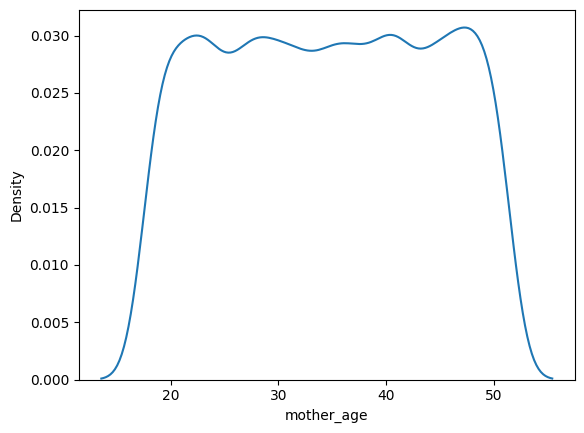

In [25]:
sns.kdeplot(df['mother_age'])

<Axes: xlabel='father_age', ylabel='Density'>

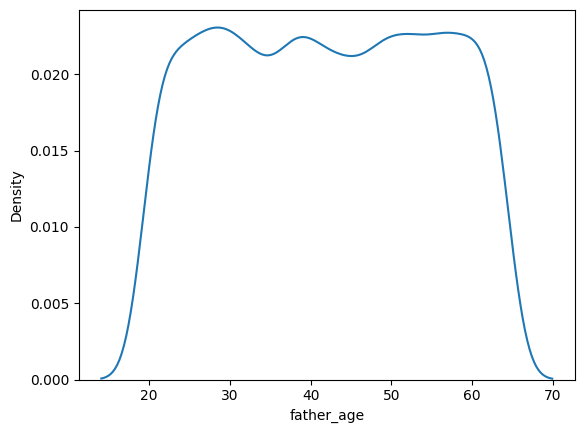

In [26]:
sns.kdeplot(df['father_age'])

In [27]:
parent_age = ["mother_age", "father_age"]
df[parent_age] = df[parent_age].fillna(np.floor(df[parent_age].mean()))

In [28]:
np.floor(df[parent_age].mean())

mother_age    34.0
father_age    41.0
dtype: float64

In [29]:
df.shape

(17160, 33)

In [30]:
len(df['Symptom 1'].unique())

3

In [31]:
numerical_features = [feature for feature in df.columns if len(df[feature].unique()) > 10]
categorical_features = [feature for feature in df.columns if len(df[feature].unique()) < 10]
len(numerical_features), len(categorical_features)

(5, 28)

In [32]:
df[numerical_features].describe().T

,count,mean,std,min,25%,50%,75%,max
patient_age,16146.0,6.945683,4.318286,0.00000,3.000000,7.000000,11.000000,14.000000
blood_cell_count,17160.0,4.899434,0.199192,4.14623,4.764297,4.900514,5.033921,5.609829
mother_age,17160.0,34.430536,8.526641,18.00000,29.000000,34.000000,40.000000,51.000000
father_age,17160.0,41.726515,11.351844,20.00000,34.000000,41.000000,50.000000,64.000000
WBC_count,15626.0,7.470663,2.650636,3.00000,5.417074,7.461071,9.515633,12.000000


In [ ]:
# Define imputers
imp_mode = SimpleImputer(strategy='most_frequent')
imp_median = SimpleImputer(strategy='median')

# Loop over columns
for col in df.columns:
    if df[col].dtype != "object" and df[col].nunique() <= 3:
        # Numeric with few unique values -> use mode
        df[col] = imp_mode.fit_transform(df[[col]]).ravel()
    
    elif df[col].dtype != "object" and df[col].nunique() > 3:
        # Continuous numeric -> use median
        df[col] = imp_median.fit_transform(df[[col]]).ravel()
    
    else:
        # Categorical -> use mode
        df[col] = imp_mode.fit_transform(df[[col]]).ravel()

In [34]:
df.isna().sum()

patient_age                     0
defective_mother                0
defective_father                0
maternal_gene                   0
paternal_gene                   0
blood_cell_count                0
mother_age                      0
father_age                      0
Status                          0
respiratory_rate                0
heart_rate                      0
follow_up                       0
Gender                          0
birth_asphyxia                  0
birth_defect_autopsy            0
birth_place                     0
folic_acid_periconceptional     0
maternal_illness                0
radiation_exposure              0
substance_abuse                 0
assisted_conception             0
previous_pregnancy_anomalies    0
num_previous_abortion           0
birth_defects                   0
WBC_count                       0
blood_test_result               0
Symptom 1                       0
Symptom 2                       0
Symptom 3                       0
Symptom 4     

In [35]:
# printing the unique values of all columns
for col in df.columns:
    print(f"{col}: {df[col].unique()}")

patient_age: [ 2.  6. 12. 11. 14.  3.  4.  7.  1.  0. 10.  5.  8.  9. 13.]
defective_mother: ['Yes' 'No']
defective_father: ['No' 'Yes']
maternal_gene: ['Yes' 'No']
paternal_gene: ['No' 'Yes']
blood_cell_count: [4.76060309 4.89329743 4.70528039 ... 5.21475028 5.22482777 5.13794212]
mother_age: [34. 41. 21. 32. 40. 45. 44. 50. 30. 24. 36. 51. 23. 49. 46. 18. 38. 37.
 42. 48. 28. 25. 19. 47. 35. 22. 33. 20. 29. 26. 31. 27. 43. 39.]
father_age: [41. 22. 63. 44. 42. 56. 20. 24. 57. 48. 30. 55. 62. 32. 52. 28. 31. 61.
 35. 49. 50. 23. 29. 64. 39. 34. 51. 25. 43. 60. 53. 58. 26. 27. 59. 38.
 47. 54. 21. 37. 36. 46. 40. 45. 33.]
Status: ['Alive' 'Deceased']
respiratory_rate: ['Normal (30-60)' 'Tachypnea']
heart_rate: ['Normal' 'Tachycardia']
follow_up: ['High' 'Low']
Gender: ['Ambiguous' 'Male' 'Female']
birth_asphyxia: ['Yes' 'No record' 'Not available' 'No']
birth_defect_autopsy: ['Not applicable' 'No' 'Yes']
birth_place: ['Institute' 'Home']
folic_acid_periconceptional: ['No' 'Yes']
matern

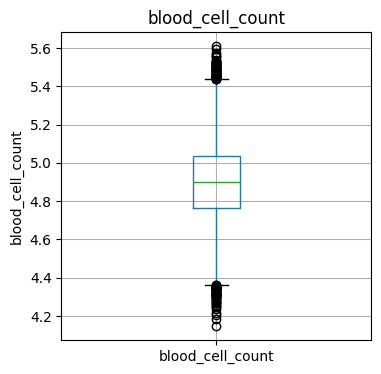

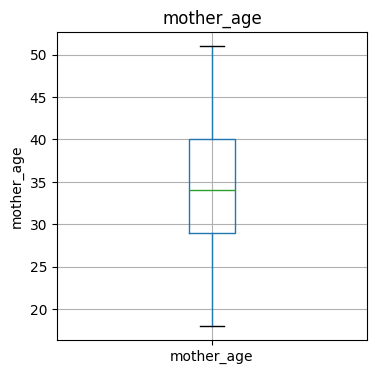

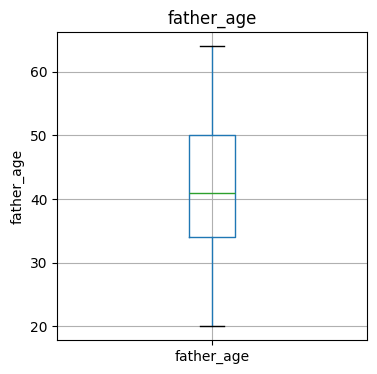

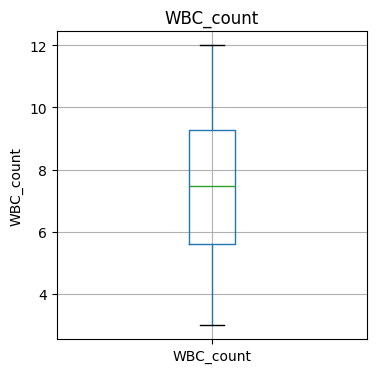

In [35]:
# Box plots
for feature in numerical_features:
  data = df.copy()

  if 0 in data[feature].unique():
    pass
  else:
    plt.figure(figsize=(4,4))
    data[feature] = data[feature]
    data.boxplot(column=feature)
    plt.ylabel(feature)
    plt.title(feature)
    plt.show()

In [36]:
# removing outliers
def remove_outliers_iqr(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower) & (df[col] <= upper)]
    return df

# Apply on numerical features
num_cols = numerical_features
df_clean = remove_outliers_iqr(df, num_cols)

In [37]:
len(categorical_features)

28

In [38]:
categorical_features

['defective_mother',
 'defective_father',
 'maternal_gene',
 'paternal_gene',
 'Status',
 'respiratory_rate',
 'heart_rate',
 'follow_up',
 'Gender',
 'birth_asphyxia',
 'birth_defect_autopsy',
 'birth_place',
 'folic_acid_periconceptional',
 'maternal_illness',
 'radiation_exposure',
 'substance_abuse',
 'assisted_conception',
 'previous_pregnancy_anomalies',
 'num_previous_abortion',
 'birth_defects',
 'blood_test_result',
 'Symptom 1',
 'Symptom 2',
 'Symptom 3',
 'Symptom 4',
 'Symptom 5',
 'genetic_disorder',
 'disorder_subclass']

In [39]:
# label encoding
def label_encode_cat_features(data, cat_features):
    label_encoder = LabelEncoder()
    data_encoded = data.copy()
    
    for col in cat_features:
        data_encoded[col] = label_encoder.fit_transform(data[col])
    
    data = data_encoded
    return data

df = label_encode_cat_features(df, categorical_features)

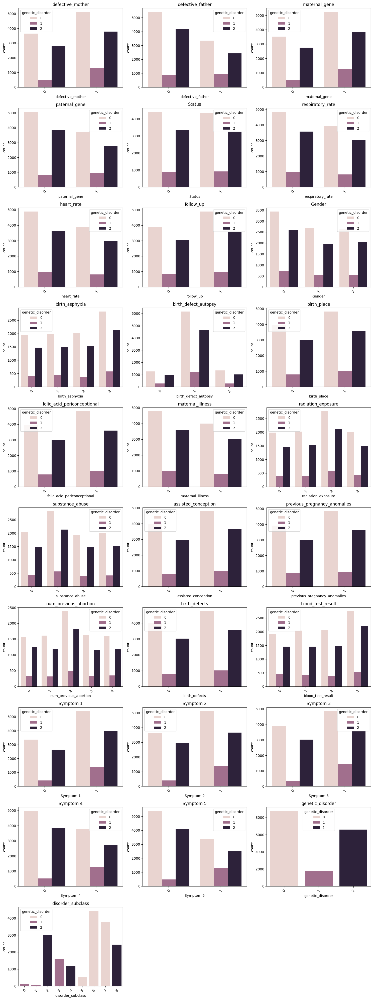

In [40]:
n_cols = 3
n_features = len(categorical_features)
n_rows = math.ceil(n_features / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(categorical_features):
    sns.countplot(data=df, x=feature, hue='genetic_disorder', ax=axes[i])
    axes[i].set_title(f"{feature}", fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Remove unused subplots
for j in range(len(categorical_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

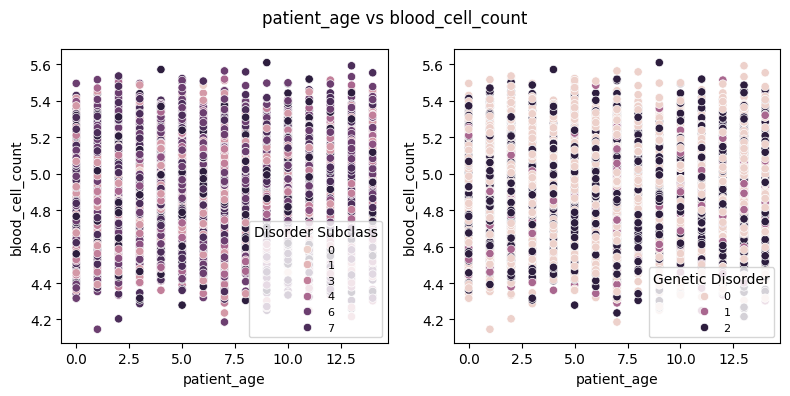

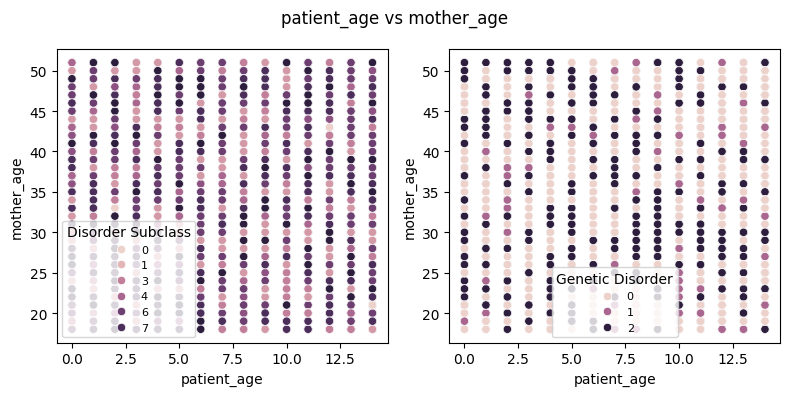

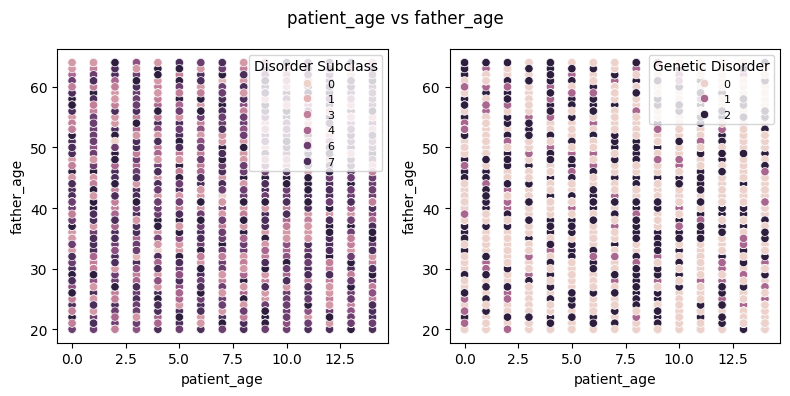

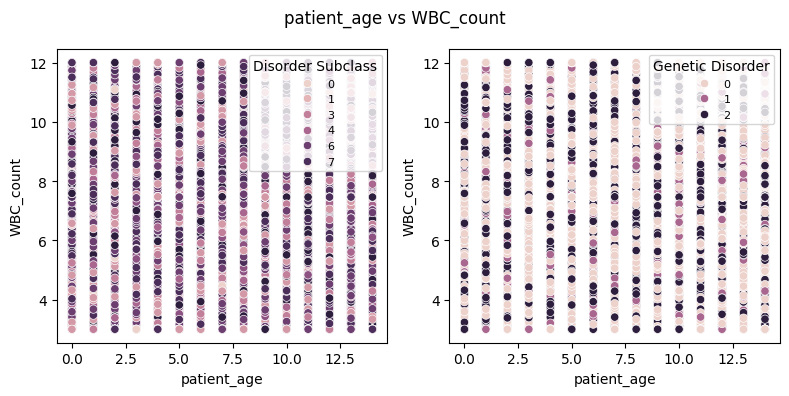

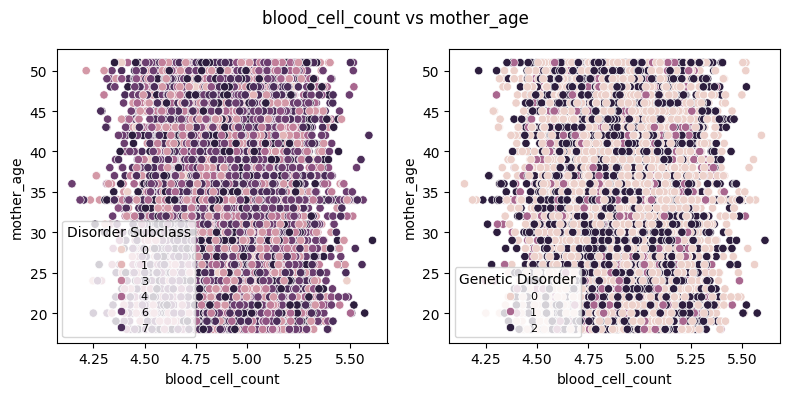

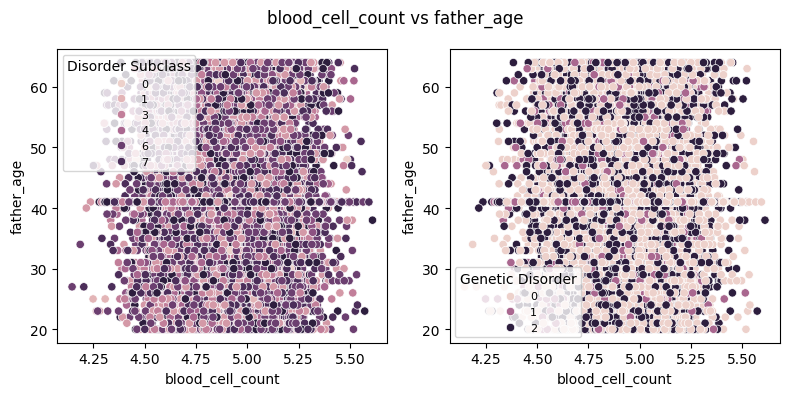

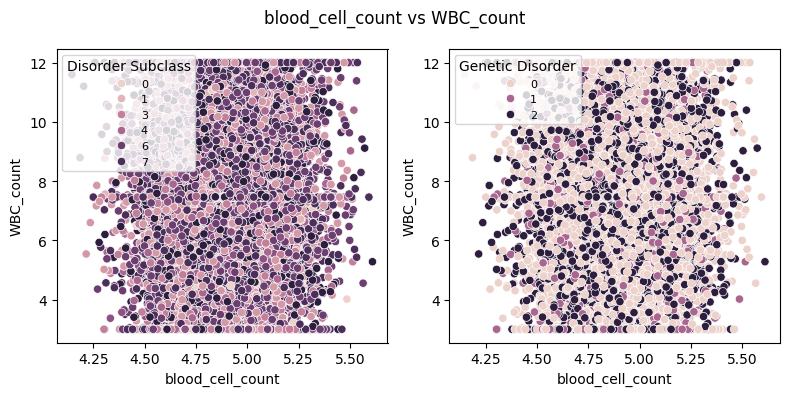

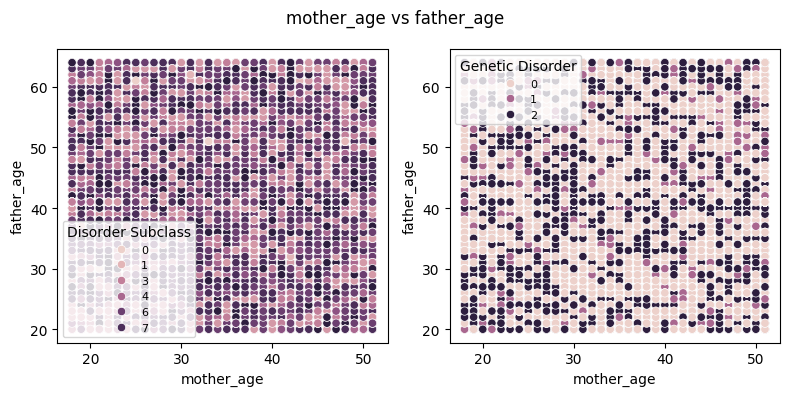

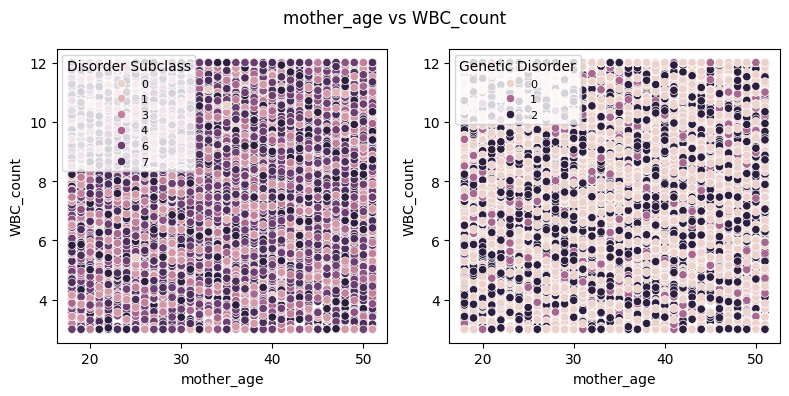

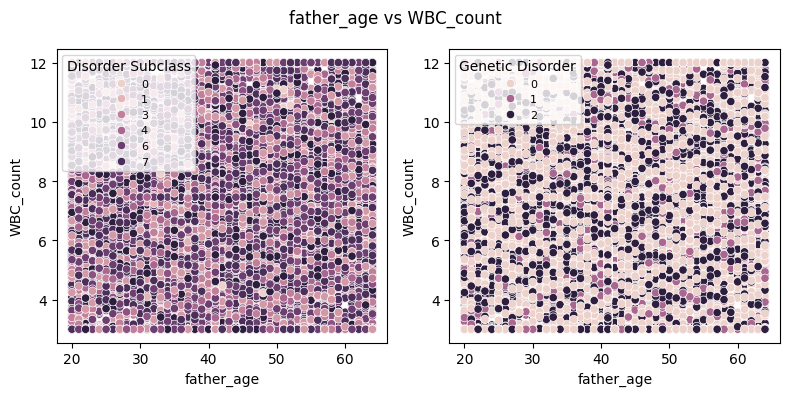

In [ ]:
# scatter plot
def check_pair(pair, pair_dict):
    f1, f2 = pair
    # If f1 already has f2 recorded or vice versa -> duplicate
    if f1 in pair_dict and f2 in pair_dict[f1]:
        return False
    if f2 in pair_dict and f1 in pair_dict[f2]:
        return False
    return True

def append_pair(pair, pair_dict):
    f1, f2 = pair
    pair_dict.setdefault(f1, []).append(f2)
    pair_dict.setdefault(f2, []).append(f1)

pair_dict = dict()

for f1 in numerical_features:
    for f2 in numerical_features:
        if f1 == f2:
            continue
        else:
            pair = (f1, f2)
            if check_pair(pair, pair_dict):
                append_pair(pair, pair_dict)
                fig, axes = plt.subplots(1, 2, figsize=(8, 4))  
                
                # Left subplot: disorder_subclass
                sns.scatterplot(data=df, x=f1,y=f2, hue='disorder_subclass', ax=axes[0])
                axes[0].legend(title="Disorder Subclass", fontsize=8)
                
                # Right subplot: genetic_disorder
                sns.scatterplot(data=df, x=f1,y=f2, hue='genetic_disorder', ax=axes[1])
                axes[1].legend(title="Genetic Disorder", fontsize=8)
                plt.suptitle(f'{f1} vs {f2}')
                plt.tight_layout()
                plt.show()


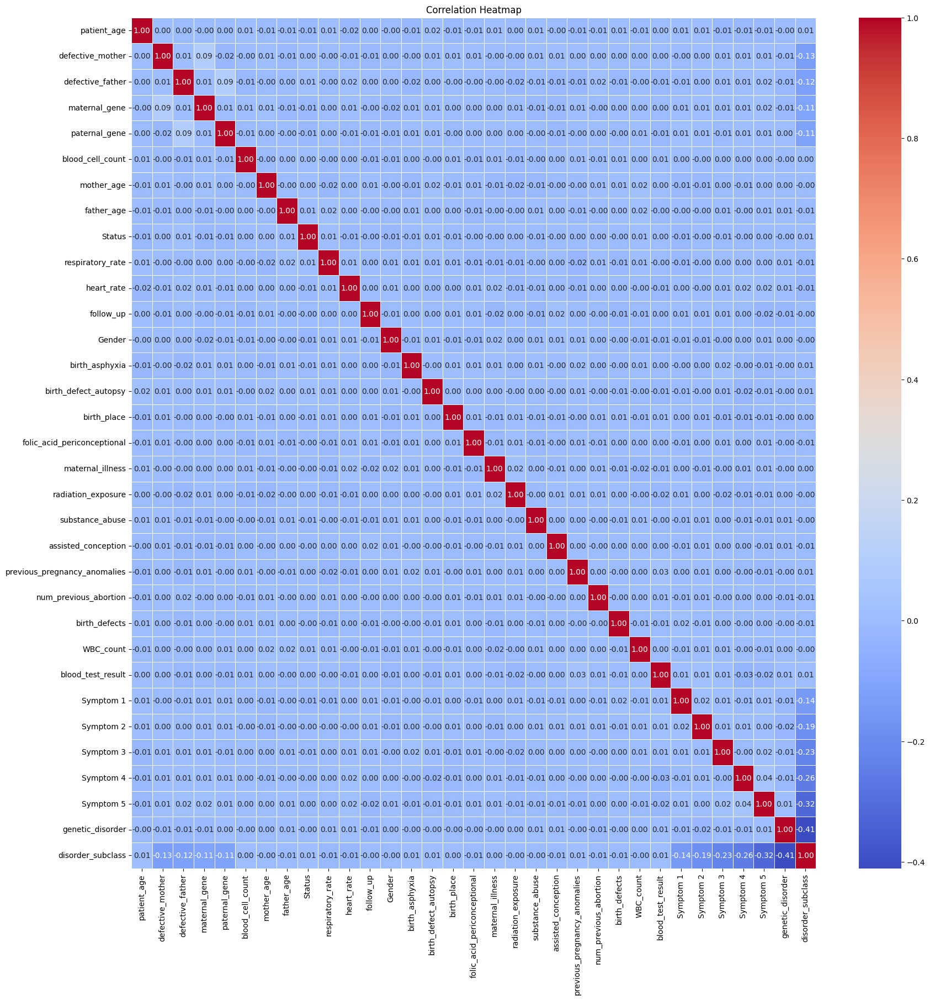

In [197]:
corr_matrix = df.corr()
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

There seems to be any significant correlation between the features.

## Model

In [40]:
X = df.drop(['genetic_disorder', 'disorder_subclass'], axis=1)
y = df[['genetic_disorder', 'disorder_subclass']] # to check later
X.head()

,patient_age,defective_mother,defective_father,maternal_gene,paternal_gene,blood_cell_count,mother_age,father_age,Status,respiratory_rate,heart_rate,follow_up,Gender,birth_asphyxia,birth_defect_autopsy,birth_place,folic_acid_periconceptional,maternal_illness,radiation_exposure,substance_abuse,assisted_conception,previous_pregnancy_anomalies,num_previous_abortion,birth_defects,WBC_count,blood_test_result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5
0,2.0,1,0,1,0,4.760603,34.0,41.0,0,0,0,0,0,3,1,1,0,0,1,1,0,1,2,1,9.857562,3,1,1,1,1,1
2,6.0,1,0,0,0,4.893297,41.0,22.0,0,0,1,1,0,1,1,1,1,0,3,1,1,1,4,1,7.461071,2,0,1,1,1,1
3,12.0,1,0,1,0,4.705280,21.0,41.0,1,1,0,0,2,2,0,1,0,1,0,2,1,1,1,1,7.919321,1,0,0,1,0,0
4,11.0,1,0,1,1,4.720703,32.0,41.0,0,1,1,1,2,2,1,1,0,1,0,2,1,0,4,0,4.098210,3,0,0,0,0,0
5,14.0,1,0,1,0,5.103188,34.0,41.0,1,0,0,1,1,2,1,1,0,0,1,1,1,0,0,0,10.272230,2,1,0,0,1,0


In [50]:
# finding optimal k using elbow method
sse = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i , max_iter=300)
    kmeans.fit(X) 
    sse.append(kmeans.inertia_)

fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=600, height=600,)

According to the above graph, at K = 7 we see a sharp deviation, hence it is the optimal K. 

In [41]:
seed = 42

In [48]:
X.shape

(17160, 31)

In [52]:
numerical_features

['patient_age', 'blood_cell_count', 'mother_age', 'father_age', 'WBC_count']

In [55]:
def plot_clusters_df(df, labels, title):
    plt.figure(figsize=(6,5))
    scatter = plt.scatter(df['blood_cell_count'], df['WBC_count'], c=labels, cmap="tab10", s=50)
    plt.xlabel("Blood Cell Count")
    plt.ylabel("WBC Count")
    plt.title(title)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.show()


def model_evaluate(model_names, model_list, X):
    result_log = dict()
    
    for name, model in zip(model_names, model_list):
        # Fit and predict
        labels = model.fit_predict(X)
        
        # Check number of clusters (excluding noise for DBSCAN, label = -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        
        if n_clusters > 1:  # only evaluate if ≥2 clusters
            db_index = davies_bouldin_score(X, labels)
            ss_score = silhouette_score(X, labels)
            result_log[name] = [db_index, ss_score]
            plot_clusters_df(X, labels, title=f'{name} Clusters')
        else:
            result_log[name] = ["Not Applicable", "Not Applicable"]
    
    return result_log

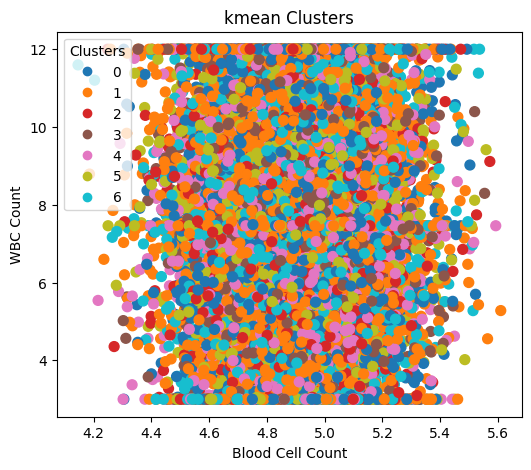

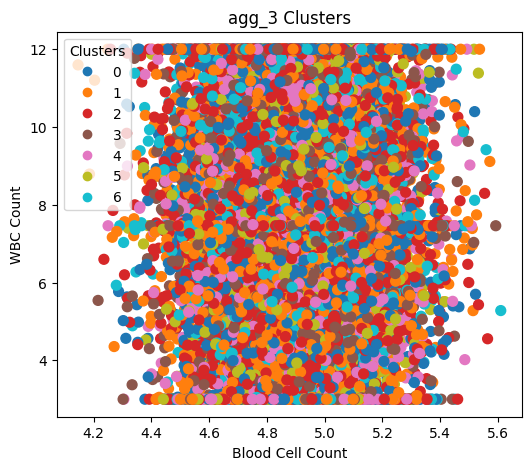

In [56]:
# models
model_kmean = KMeans(n_clusters = 7, init = 'k-means++', max_iter = 300)
model_agg3 = AgglomerativeClustering(n_clusters=7)

model_list = [model_kmean, model_agg3]
model_name = ["kmean", "agg_3"]

result_log = model_evaluate(model_name, model_list, X)

In [57]:
result_log

{'kmean': [1.2116213958689441, 0.2552734245512062],
 'agg_3': [1.2638962216312533, 0.193120303006231]}

###  Interpreting these metrics
#### Davies–Bouldin Index (DBI)
- Lower is better.
- It measures cluster similarity:
  - 0 = perfectly separated clusters
  - Higher values = clusters overlap more

- KMeans: `1.21` (better)
- Agglomerative (7 clusters): `1.26` (worse separation)



#### Silhouette Score
- Range: [-1, 1]
  - Close to 1: well-separated, compact clusters
  - Around 0: overlapping clusters
  - Negative: points assigned to wrong clusters

- KMeans: `0.25` -> clusters are very weakly separated
- Agglomerative: `0.19` -> even weaker

In [42]:
# Standard scaling
X_std = StandardScaler().fit_transform(X)

# Robust scaling (good if many outliers)
X_rob = RobustScaler().fit_transform(X)

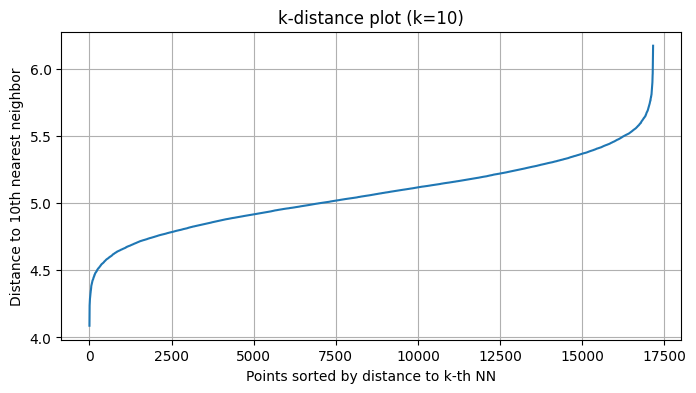

In [59]:
def plot_k_distance(X_arr, k=5):
    nbrs = NearestNeighbors(n_neighbors=k).fit(X_arr)
    distances, indices = nbrs.kneighbors(X_arr)
    # distance to k-th neighbor (k-1 index because neighbors include self)
    k_dist = distances[:, -1]
    k_dist_sorted = np.sort(k_dist)
    plt.figure(figsize=(8,4))
    plt.plot(k_dist_sorted)
    plt.xlabel("Points sorted by distance to k-th NN")
    plt.ylabel(f"Distance to {k}th nearest neighbor")
    plt.title(f"k-distance plot (k={k})")
    plt.grid(True)
    plt.show()

plot_k_distance(X_std, k=10)   # if you plan min_samples=10


In [43]:
# finding optimal dbscan parameters
def dbscan_eps_scan(X_arr, eps_values, min_samples=5):
    results = []
    n = X_arr.shape[0]
    for eps in eps_values:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_arr)
        labels = db.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = np.sum(labels == -1)
        results.append((eps, n_clusters, n_noise, n_noise / n))
    return results


In [61]:
eps_grid = np.linspace(0.01, 100.0, 25)
min_samples_grid = [3, 5, 7, 10, 15]

best = []
for min_samples in min_samples_grid:
    print(min_samples)
    res = dbscan_eps_scan(X_std, eps_grid, min_samples=min_samples)

    for eps, n_clusters, n_noise, frac_noise in res:
        best.append((min_samples, eps, n_clusters, frac_noise))
        print(f"min_samples={min_samples}, eps={eps:.3f}, clusters={n_clusters:2d}, frac_noise={frac_noise:.3f}")
    print()

3
min_samples=3, eps=0.010, clusters= 0, frac_noise=1.000
min_samples=3, eps=4.176, clusters=465, frac_noise=0.832
min_samples=3, eps=8.342, clusters= 1, frac_noise=0.000
min_samples=3, eps=12.509, clusters= 1, frac_noise=0.000
min_samples=3, eps=16.675, clusters= 1, frac_noise=0.000
min_samples=3, eps=20.841, clusters= 1, frac_noise=0.000
min_samples=3, eps=25.008, clusters= 1, frac_noise=0.000
min_samples=3, eps=29.174, clusters= 1, frac_noise=0.000
min_samples=3, eps=33.340, clusters= 1, frac_noise=0.000
min_samples=3, eps=37.506, clusters= 1, frac_noise=0.000
min_samples=3, eps=41.672, clusters= 1, frac_noise=0.000
min_samples=3, eps=45.839, clusters= 1, frac_noise=0.000
min_samples=3, eps=50.005, clusters= 1, frac_noise=0.000
min_samples=3, eps=54.171, clusters= 1, frac_noise=0.000
min_samples=3, eps=58.337, clusters= 1, frac_noise=0.000
min_samples=3, eps=62.504, clusters= 1, frac_noise=0.000
min_samples=3, eps=66.670, clusters= 1, frac_noise=0.000
min_samples=3, eps=70.836, clus

In [66]:
df.columns, numerical_features

(Index(['patient_age', 'defective_mother', 'defective_father', 'maternal_gene',
        'paternal_gene', 'blood_cell_count', 'mother_age', 'father_age',
        'Status', 'respiratory_rate', 'heart_rate', 'follow_up', 'Gender',
        'birth_asphyxia', 'birth_defect_autopsy', 'birth_place',
        'folic_acid_periconceptional', 'maternal_illness', 'radiation_exposure',
        'substance_abuse', 'assisted_conception',
        'previous_pregnancy_anomalies', 'num_previous_abortion',
        'birth_defects', 'WBC_count', 'blood_test_result', 'Symptom 1',
        'Symptom 2', 'Symptom 3', 'Symptom 4', 'Symptom 5', 'genetic_disorder',
        'disorder_subclass'],
       dtype='object'),
 ['patient_age', 'blood_cell_count', 'mother_age', 'father_age', 'WBC_count'])

In [64]:
def plot_clusters_arr(arr, labels, title):
    plt.figure(figsize=(6,5))
    scatter = plt.scatter(arr[:,5],arr[:, 24], c=labels, cmap="tab10", s=50)
    plt.xlabel("Blood Cell Count")
    plt.ylabel("WBC Count")
    plt.title(title)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.show()

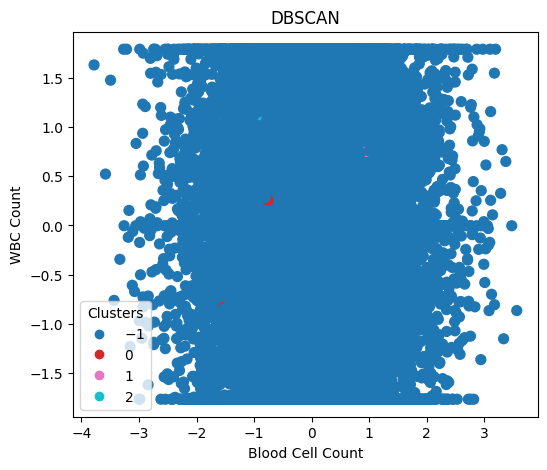

Number of clusters (excluding noise): 3
Davies-Bouldin Score: 6.3637
Silhouette Score: -0.2157


In [65]:
# DBSCAN
db = DBSCAN(eps=4.176, min_samples=10)  
labels_db = db.fit_predict(X_std)

plot_clusters_arr(X_std, labels_db, 'DBSCAN')

# Number of clusters (excluding noise)
n_clusters_ = len(set(labels_db)) - (1 if -1 in labels_db else 0)
print("Number of clusters (excluding noise):", n_clusters_)

# Only evaluate if at least 2 clusters
if n_clusters_ > 1:
    db_index = davies_bouldin_score(X, labels_db)
    ss_score = silhouette_score(X, labels_db)
    print(f"Davies-Bouldin Score: {db_index:.4f}")
    print(f"Silhouette Score: {ss_score:.4f}")
else:
    print("Not enough clusters for evaluation.")

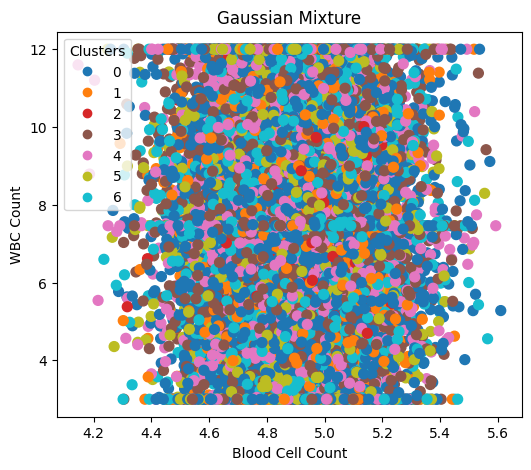

Gaussian Mixture Model:
  Davies-Bouldin Score: 19.2937
  Silhouette Score: -0.0945


In [69]:
# Gaussian Mixture 
gmm = GaussianMixture(n_components=7, covariance_type='full', random_state=42)
labels_gmm = gmm.fit_predict(X)

plot_clusters_df(X, labels_gmm, 'Gaussian Mixture')

db_index_gmm = davies_bouldin_score(X, labels_gmm)
ss_score_gmm = silhouette_score(X, labels_gmm)

print("Gaussian Mixture Model:")
print(f"  Davies-Bouldin Score: {db_index_gmm:.4f}")
print(f"  Silhouette Score: {ss_score_gmm:.4f}")


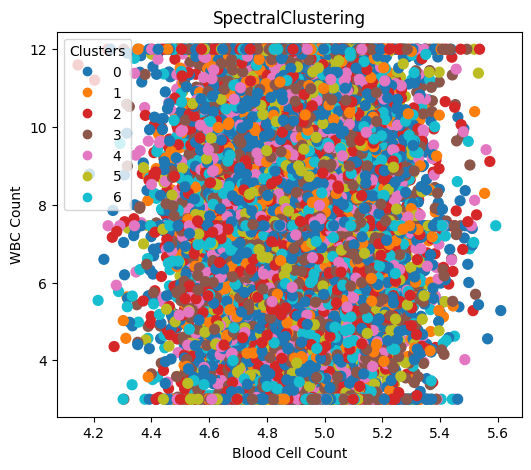

Spectral Clustering:
  Davies-Bouldin Score: 1.1920
  Silhouette Score: 0.2501


In [70]:
# Spectral Clustering
sc = SpectralClustering(n_clusters=7, affinity='nearest_neighbors', random_state=42)
labels_sc = sc.fit_predict(X)

plot_clusters_df(X, labels_sc, 'SpectralClustering')

db_index_sc = davies_bouldin_score(X, labels_sc)
ss_score_sc = silhouette_score(X, labels_sc)

print("Spectral Clustering:")
print(f"  Davies-Bouldin Score: {db_index_sc:.4f}")
print(f"  Silhouette Score: {ss_score_sc:.4f}")

| Model   | Davies-Bouldin Score | Silhouette Score |
|---------|----------------------|------------------|
| kmean   | 1.2116               | 0.2552           |
| agg_3   | 1.2611               | 0.1931           |
| DBscan  | 6.3637               | -0.2157          |
| GMM     | 19.2937              | -0.0945          |
| SC      | 1.1920               | 0.2501           |


According to the Davies-Bouldin score, Spectral Clustering is forming the best clusters while according to Silhouette score, Kmeans is giving the best results.

## PCA

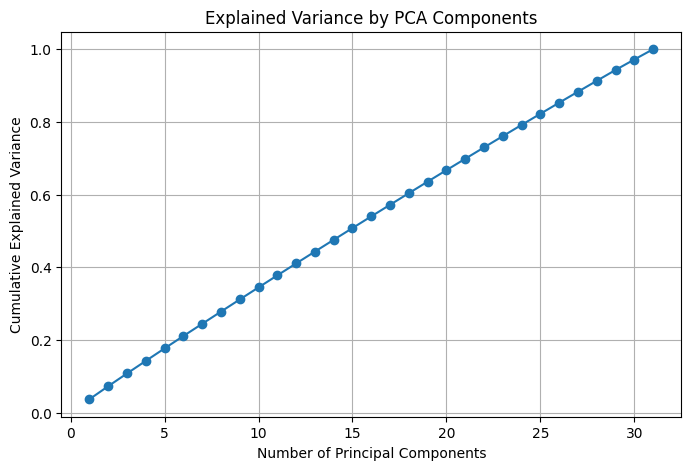

In [44]:
# Fit PCA without limiting components
pca = PCA()
X_pca = pca.fit_transform(X_std)

# Explained variance ratio
explained_var = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_var)+1), explained_var, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid(True)
plt.show()

In [45]:
y.columns

Index(['genetic_disorder', 'disorder_subclass'], dtype='object')

In [73]:
fig = px.scatter(x=X_pca[:, 0], y=X_pca[:, 1], color=y['disorder_subclass'])
fig.update_layout(
    title="PCA visualization",
    xaxis_title="First Principal Component",
    yaxis_title="Second Principal Component",
)
fig.show()

In [74]:
fig = px.scatter(x=X_pca[:, 0], y=X_pca[:, 1], color=y['genetic_disorder'])
fig.update_layout(
    title="PCA visualization",
    xaxis_title="First Principal Component",
    yaxis_title="Second Principal Component",
)
fig.show()

In [46]:
# Example: keep enough PCs for 95% variance
pca_25 = PCA(n_components=0.25)   # keeps min PCs that explain 95% variance
X_reduced = pca_25.fit_transform(X_std)

pca_45 = PCA(n_components=0.45)
X_reduced_45 = pca_45.fit_transform(X_std)

print("Original shape:", X.shape)
print("Reduced shape:", X_reduced.shape)
print("Reduced shape:", X_reduced_45.shape)

Original shape: (17160, 31)
Reduced shape: (17160, 8)
Reduced shape: (17160, 14)


In [76]:
fig = px.scatter(x=X_reduced_45[:, 1], y=X_reduced_45[:, 2], color=y['genetic_disorder'])
fig.update_layout(
    title="PCA visualization",
    xaxis_title="First Principal Component",
    yaxis_title="Second Principal Component",
)
fig.show()

In [85]:
# finding optimal k using elbow method
sse = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i , max_iter=100)
    kmeans.fit(X_pca) 
    sse.append(kmeans.inertia_)

fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=600, height=600,)

We can check values at k=15.

In [87]:
# finding optimal k using elbow method
sse = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i , max_iter=75)
    kmeans.fit(X_reduced) 
    sse.append(kmeans.inertia_)

fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=600, height=600,)

We cannot see any major deviation for this. Going forward with K=15 for this as well.

In [90]:
# finding optimal k using elbow method
sse = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i , max_iter=100)
    kmeans.fit(X_reduced_45) 
    sse.append(kmeans.inertia_)

fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=600, height=600,)

We do not observe any major deviation, even for this I am going forward with K=15.

In [91]:
# finding optimal dbscan params
eps_grid = np.linspace(0.01, 100.0, 25)
min_samples_grid = [3, 5, 7, 10, 15]

best = []
for min_samples in min_samples_grid:
    print(min_samples)
    res = dbscan_eps_scan(X_reduced, eps_grid, min_samples=min_samples)
    # collect rows where number of clusters >= 2
    for eps, n_clusters, n_noise, frac_noise in res:
        best.append((min_samples, eps, n_clusters, frac_noise))
        print(f"min_samples={min_samples}, eps={eps:.3f}, clusters={n_clusters:2d}, frac_noise={frac_noise:.3f}")
    print()

3
min_samples=3, eps=0.010, clusters= 0, frac_noise=1.000
min_samples=3, eps=4.176, clusters= 1, frac_noise=0.000
min_samples=3, eps=8.342, clusters= 1, frac_noise=0.000
min_samples=3, eps=12.509, clusters= 1, frac_noise=0.000
min_samples=3, eps=16.675, clusters= 1, frac_noise=0.000
min_samples=3, eps=20.841, clusters= 1, frac_noise=0.000
min_samples=3, eps=25.008, clusters= 1, frac_noise=0.000
min_samples=3, eps=29.174, clusters= 1, frac_noise=0.000
min_samples=3, eps=33.340, clusters= 1, frac_noise=0.000
min_samples=3, eps=37.506, clusters= 1, frac_noise=0.000
min_samples=3, eps=41.672, clusters= 1, frac_noise=0.000
min_samples=3, eps=45.839, clusters= 1, frac_noise=0.000
min_samples=3, eps=50.005, clusters= 1, frac_noise=0.000
min_samples=3, eps=54.171, clusters= 1, frac_noise=0.000
min_samples=3, eps=58.337, clusters= 1, frac_noise=0.000
min_samples=3, eps=62.504, clusters= 1, frac_noise=0.000
min_samples=3, eps=66.670, clusters= 1, frac_noise=0.000
min_samples=3, eps=70.836, clust

From the above result, we can observe that only 1 cluster is dominant for DBScan

In [ ]:
def model_evaluateV2(model_names, model_list):
    result_log = dict()
    labels_log = dict()

    for name, model in zip(model_names, model_list):
        # Clone models
        m1 = clone(model)
        m2 = clone(model)
        m3 = clone(model)

        m1_name = name + "_pca"
        m2_name = name + "_reduced"
        m3_name = name + "_reduced45"

        labels_1 = m1.fit_predict(X_pca)         # 2D
        labels_2 = m2.fit_predict(X_reduced)     # 8D
        labels_3 = m3.fit_predict(X_reduced_45)  # 14D

        labels_log[m1_name] = labels_1
        labels_log[m2_name] = labels_2
        labels_log[m3_name] = labels_3
        
        n_clusters_1 = len(set(labels_1)) - (1 if -1 in labels_1 else 0)
        n_clusters_2 = len(set(labels_2)) - (1 if -1 in labels_2 else 0)
        n_clusters_3 = len(set(labels_3)) - (1 if -1 in labels_3 else 0)
        
        if n_clusters_1 > 1:  
            db_index_1 = davies_bouldin_score(X_pca, labels_1)
            ss_score_1 = silhouette_score(X_pca, labels_1)
            result_log[m1_name] = [db_index_1, ss_score_1]
            
        else:
            result_log[m1_name] = ["Not Applicable", "Not Applicable"]
        
        if n_clusters_2 > 1:  
            db_index_2 = davies_bouldin_score(X_reduced, labels_2)
            ss_score_2 = silhouette_score(X_reduced, labels_2)
            result_log[m2_name] = [db_index_2, ss_score_2]
        else:
            result_log[m2_name] = ["Not Applicable", "Not Applicable"]
        
        if n_clusters_3 > 1:  
            db_index_3 = davies_bouldin_score(X_reduced_45, labels_3)
            ss_score_3 = silhouette_score(X_reduced_45, labels_3)
            result_log[m3_name] = [db_index_3, ss_score_3]
        else:
            result_log[m3_name] = ["Not Applicable", "Not Applicable"]
    
    return result_log, labels_log

In [47]:
# k = 10 included to compare the result from earlier approach
cluster_list = [10,15]
cluster_log_pca = dict()

print("Model", "Davies-Bouldin Score","Silhouette Score")
for cluster_num in cluster_list:
    model_kmean_cluster_num = KMeans(n_clusters = cluster_num, init = 'k-means++', max_iter = 300, random_state=42)
    model_agg_cluster_num = AgglomerativeClustering(n_clusters=cluster_num)
    model_gmm_cluster_num = GaussianMixture(n_components=cluster_num, covariance_type='full', random_state=42)
    model_sc = SpectralClustering(n_clusters=cluster_num, affinity='nearest_neighbors', random_state=42)

    model_list = [model_kmean_cluster_num, model_agg_cluster_num, model_gmm_cluster_num, model_sc]
    model_name = [f"kmean_{cluster_num}", f"agg_{cluster_num}", f"gmm_{cluster_num}", f"sc_{cluster_num}"]

    result_log_pca, labels_log_pca = model_evaluateV2(model_name, model_list)
    cluster_log_pca[cluster_num] = [result_log_pca, labels_log_pca]

    for key, value in result_log_pca.items():
        print(key, f'{value[0]:.4f}', f'{value[1]:.4f}', sep="\t")
        
    print("--------------------------")


Model Davies-Bouldin Score Silhouette Score
kmean_10_pca	4.6873	0.0172
kmean_10_reduced	1.9709	0.0810
kmean_10_reduced45	2.7336	0.0438
agg_10_pca	7.4963	-0.0084
agg_10_reduced	2.7513	0.0075
agg_10_reduced45	4.3079	-0.0074
gmm_10_pca	4.6899	0.0047
gmm_10_reduced	3.3497	-0.0270
gmm_10_reduced45	5.2576	0.0036
sc_10_pca	4.5807	0.0120
sc_10_reduced	2.0801	0.0654
sc_10_reduced45	2.8672	0.0338
--------------------------
kmean_15_pca	4.3431	0.0188
kmean_15_reduced	1.8087	0.0846
kmean_15_reduced45	2.4880	0.0449
agg_15_pca	6.8153	-0.0117
agg_15_reduced	2.6334	-0.0015
agg_15_reduced45	4.1349	-0.0099
gmm_15_pca	4.9661	0.0130
gmm_15_reduced	2.3954	0.0026
gmm_15_reduced45	3.8952	-0.0251
sc_15_pca	4.4599	0.0105
sc_15_reduced	2.2415	0.0513
sc_15_reduced45	2.6419	0.0334
--------------------------


In [54]:
labels_log_list = [value[-1] for _, value in cluster_log_pca.items()]
for labels_log in labels_log_list:
    print(len(labels_log))

12
12


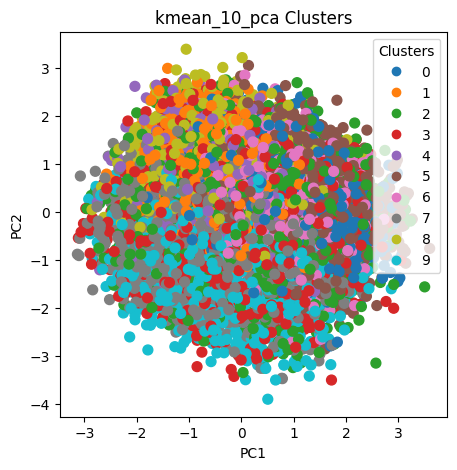

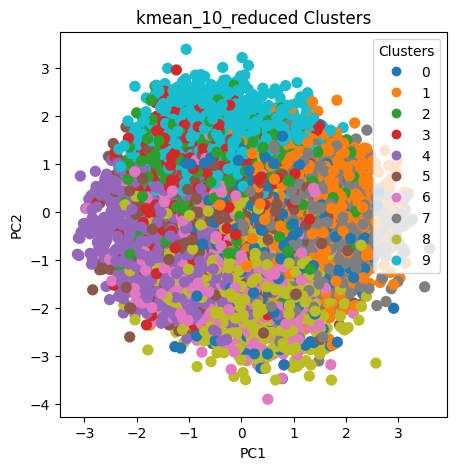

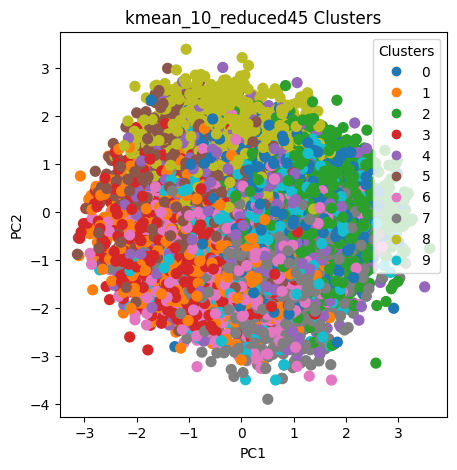

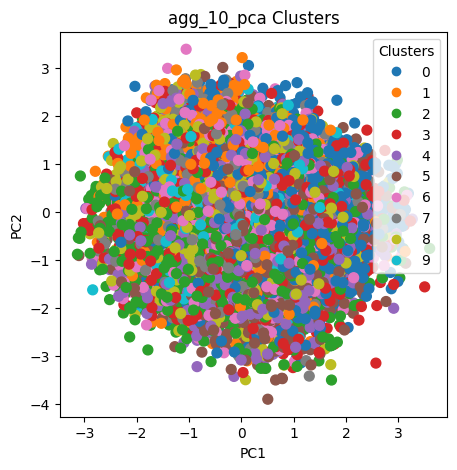

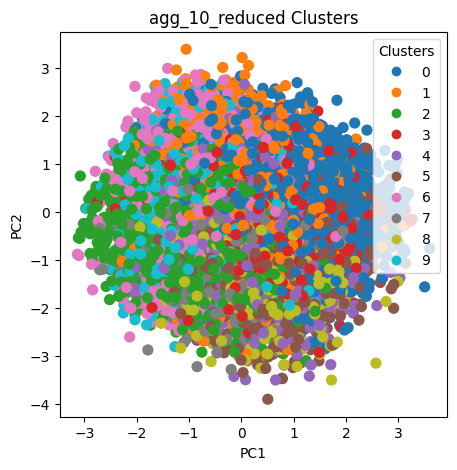

...

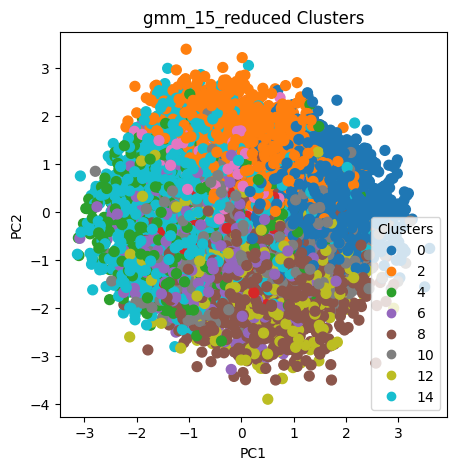

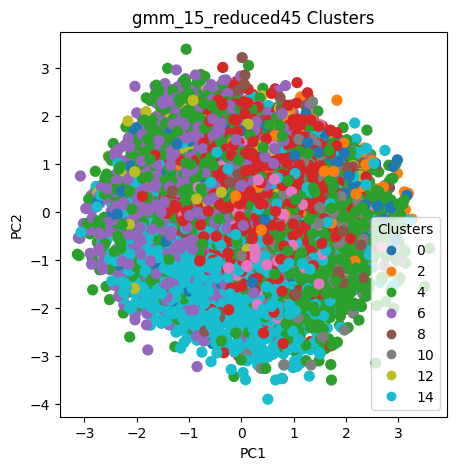

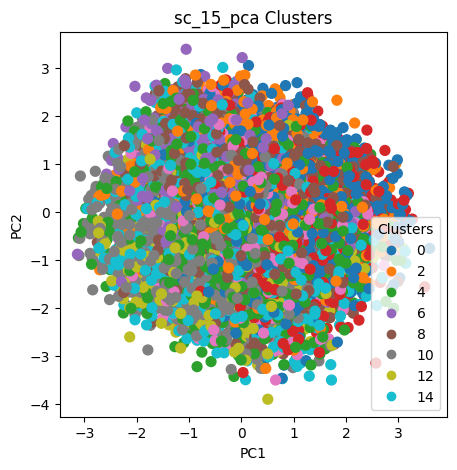

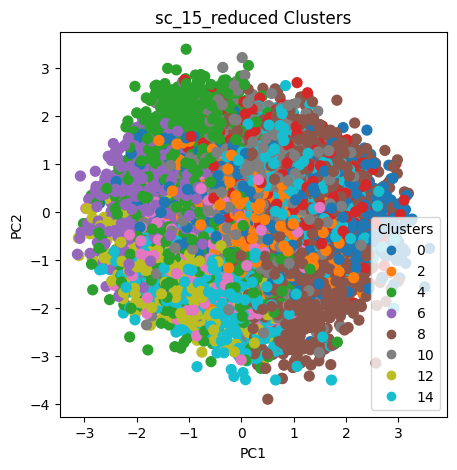

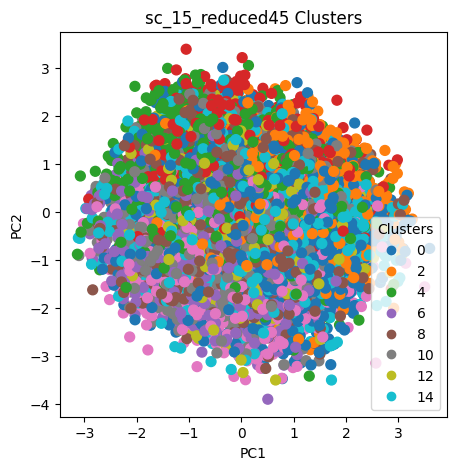

In [55]:
def plot_clusters_col_2(arr, labels, title):
    plt.figure(figsize=(5,5))
    scatter = plt.scatter(arr[:,0], arr[:,1], c=labels, cmap="tab10", s=50)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(title)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.show()

labels_log_list = [value[-1] for _, value in cluster_log_pca.items()]

for labels_log in labels_log_list:
    for key, value in labels_log.items():
        if key.endswith('_pca'):
            plot_clusters_col_2(X_pca, value, f"{key} Clusters")
        elif key.endswith('_reduced'):
            plot_clusters_col_2(X_reduced, value, f"{key} Clusters")
        else:
            plot_clusters_col_2(X_reduced_45, value, f"{key} Clusters")

## t-SNE

I am using KL divergence to evaluate the dimension reduction approach.
- Lower the KL divergence score, better it the reduced data

In [56]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne_2 = tsne.fit_transform(X)
tsne.kl_divergence_

2.0476369857788086

In [57]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_std)
tsne.kl_divergence_

4.6204962730407715

X_std is giving worst KL divergence.

The t-SNE approach supports reducing data into 1, 2 and 3 number of columns. No support for reducing into columns numbers beyond this.

In [58]:
col_list = [2,3]
tsne_log = dict()

for col in col_list:
    tsne = TSNE(n_components=col, random_state=42)
    X_tsne = tsne.fit_transform(X_std)
    tsne_log[col] = [tsne,X_tsne]
    print(f"{col}: {tsne.kl_divergence_:.4f}")

2: 4.6205
3: 4.4105


In [59]:
cluster_list = [2,3]
tsne_log_2 = dict()
for cluster in cluster_list:
    tsne = TSNE(n_components=cluster, random_state=42)
    X_tsne = tsne.fit_transform(X)
    tsne_log_2[cluster] = [tsne, X_tsne]
    print(f"{cluster}: {tsne.kl_divergence_:.4f}")

2: 2.0476
3: 1.8346


In [60]:
tsne_prim = tsne_log[2][-1]
fig = px.scatter(x=tsne_prim[:, 0], y=tsne_prim[:, 1], color=y['genetic_disorder'])
fig.update_layout(
    title="t-SNE visualization of Custom Classification dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

In [61]:
tsne_prim = tsne_log[3][-1]
fig = px.scatter(x=tsne_prim[:, 0], y=tsne_prim[:, 1], color=y['disorder_subclass'])
fig.update_layout(
    title="t-SNE visualization of Custom Classification dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

In [62]:
tsne_prim = tsne_log_2[2][-1]
fig = px.scatter(x=tsne_prim[:, 0], y=tsne_prim[:, 1], color=y['genetic_disorder'])
fig.update_layout(
    title="t-SNE visualization of dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

We are able to makeout 9 clusters in the above graph.

In [63]:
tsne_prim = tsne_log_2[3][-1]
fig = px.scatter(x=tsne_prim[:, 0], y=tsne_prim[:, 1], color=y['disorder_subclass'])
fig.update_layout(
    title="t-SNE visualization of dataset",
    xaxis_title="First t-SNE",
    yaxis_title="Second t-SNE",
)
fig.show()

We are able to observe 9 clusters from the above graph.

Moving forward we will be using tsne_log_2 dictionary.

In [64]:
tsne_X_data = [val[-1] for _, val in tsne_log_2.items()]
tsne_X_data

[array([[-24.46493  ,  -5.4103074],
        [-72.379906 ,  38.46957  ],
        [ 10.018567 , -66.46888  ],
        ...,
        [-37.468052 ,   5.063551 ],
        [-77.25029  ,  14.599098 ],
        [-75.7465   ,  46.6757   ]], dtype=float32),
 array([[ -1.7350258 ,   4.0456    , -12.2044735 ],
        [-22.264574  ,   8.405725  ,   0.13532525],
        [ -1.8994516 , -20.676773  ,   5.077726  ],
        ...,
        [ -8.799763  ,  -1.6476103 ,  -1.0294819 ],
        [-22.853594  ,   1.5755007 ,  -8.207646  ],
        [-20.665724  ,  10.186441  ,   5.299332  ]], dtype=float32)]

In [65]:
tsne_X_data[1].shape, tsne_X_data[0].shape

((17160, 3), (17160, 2))

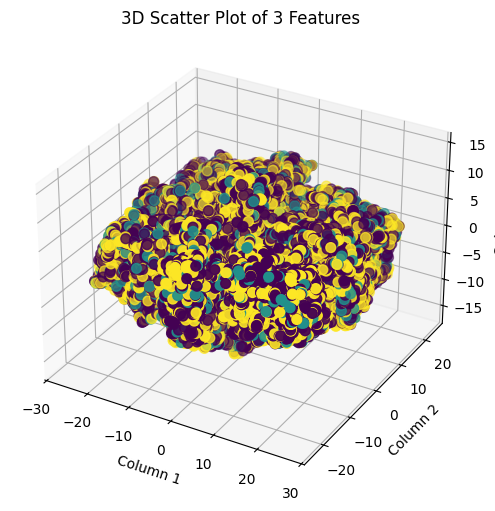

In [66]:
# Create 3D figure
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')

df_tsne_3 = pd.DataFrame(tsne_X_data[1], columns=['ColA', 'ColB', 'ColC'])
# Scatter plot
ax.scatter(df_tsne_3['ColA'], df_tsne_3["ColB"], df_tsne_3["ColC"], c=y['genetic_disorder'], cmap="viridis", s=50)

# Labels
ax.set_xlabel("Column 1")
ax.set_ylabel("Column 2")
ax.set_zlabel("Column 3")
ax.set_title("3D Scatter Plot of 3 Features")

plt.show()


In [69]:
# finding optimal k using elbow method
sse = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i , max_iter=100)
    kmeans.fit(tsne_X_data[0]) 
    sse.append(kmeans.inertia_)

fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=600, height=600,)

From the abve graphs, we can observe significant diviation at K = 9.  

In [68]:
# finding optimal k using elbow method
sse = []
for i in range(1,30):
    kmeans = KMeans(n_clusters=i , max_iter=100)
    kmeans.fit(tsne_X_data[1]) 
    sse.append(kmeans.inertia_)

fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=600, height=600,)

From the abve graphs, we can observe significant diviation at K = 9. 

In [76]:
def plot_clusters_col_3(arr, labels, title):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection="3d")
    scatter = ax.scatter(
        arr[:,0], arr[:,1], arr[:,2],
        c=labels, cmap="tab10", s=50
    )
    ax.set_xlabel("col1")
    ax.set_ylabel("col2")
    ax.set_zlabel("col3")
    ax.set_title(title)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.show()

def plot_clusters_col_2(arr, labels, title):
    plt.figure(figsize=(5,5))
    scatter = plt.scatter(arr[:,0], arr[:,1], c=labels, cmap="tab10", s=50)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.show()

In [72]:
def model_evaluateV3(model_names, model_list, tsne_list):
    result_log = dict()
    labels_log = dict()
    
    for name, model in zip(model_names, model_list):
        # Clone to avoid fitting the same model twice
        m1 = clone(model)
        m2 = clone(model)

        m1_name = name + "_2D"
        m2_name = name + "_3D"

        labels_1 = m1.fit_predict(tsne_list[0])   # 2D
        labels_2 = m2.fit_predict(tsne_list[1])   # 3D

        labels_log[m1_name] = labels_1
        labels_log[m2_name] = labels_2
        
        # --- Evaluation ---
        n_clusters_1 = len(set(labels_1)) - (1 if -1 in labels_1 else 0)
        n_clusters_2 = len(set(labels_2)) - (1 if -1 in labels_2 else 0)
        
        if n_clusters_1 > 1:
            db_index_1 = davies_bouldin_score(tsne_list[0], labels_1)
            ss_score_1 = silhouette_score(tsne_list[0], labels_1)
            result_log[m1_name] = [db_index_1, ss_score_1]
        else:
            result_log[m1_name] = ["Not Applicable", "Not Applicable"]
        
        if n_clusters_2 > 1:
            db_index_2 = davies_bouldin_score(tsne_list[1], labels_2)
            ss_score_2 = silhouette_score(tsne_list[1], labels_2)
            result_log[m2_name] = [db_index_2, ss_score_2]
        else:
            result_log[m2_name] = ["Not Applicable", "Not Applicable"]
    
    return result_log, labels_log

In [73]:
cluster_list = [9]
cluster_log_tsne = dict()
labels_log_tsne = dict()

print("Model", "Davies-Bouldin Score","Silhouette Score")

for cluster_num in cluster_list:
    model_kmean_cluster_num = KMeans(n_clusters=cluster_num, init='k-means++', max_iter=300, random_state=42)
    model_agg_cluster_num = AgglomerativeClustering(n_clusters=cluster_num)
    model_gmm_cluster_num = GaussianMixture(n_components=cluster_num, covariance_type='full', random_state=42)
    model_sc = SpectralClustering(n_clusters=cluster_num, affinity='nearest_neighbors', random_state=42)

    model_list = [model_kmean_cluster_num, model_agg_cluster_num, model_gmm_cluster_num, model_sc]
    model_name = [f"kmean_{cluster_num}", f"agg_{cluster_num}", f"gmm_{cluster_num}", f"sc_{cluster_num}"]

    result_log_tsne, labels_log = model_evaluateV3(model_name, model_list, tsne_X_data)
    cluster_log_tsne[cluster_num] = result_log_tsne
    labels_log_tsne[cluster_num] = labels_log

    for key, value in result_log_tsne.items():
        print(key, f'{value[0]}', f'{value[1]}', sep="\t\t")

    print("--------------------------")


Model Davies-Bouldin Score Silhouette Score
kmean_9_2D		0.7743102010388215		0.40572479367256165
kmean_9_3D		0.9554197553998875		0.3397669792175293
agg_9_2D		0.7281459154844818		0.3964981138706207
agg_9_3D		1.0703543824085129		0.32155442237854004
gmm_9_2D		0.7856632100103275		0.4013129770755768
gmm_9_3D		0.9712504930384063		0.3158887028694153
sc_9_2D		0.8086500939381123		0.3589795231819153
sc_9_3D		1.065510692917521		0.32634010910987854
--------------------------


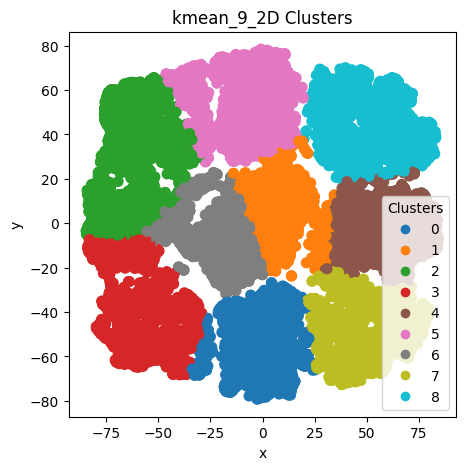

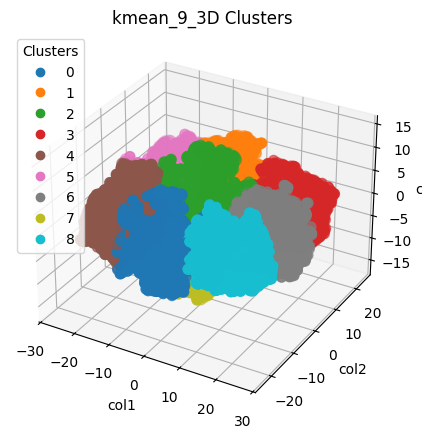

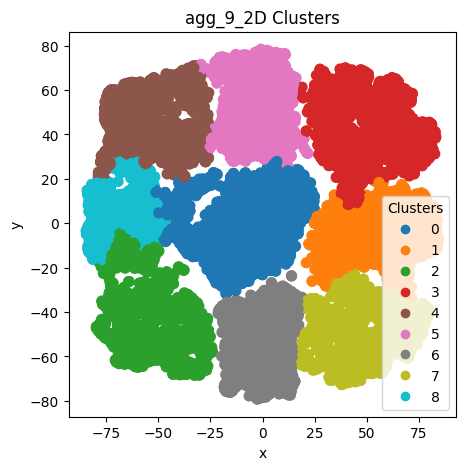

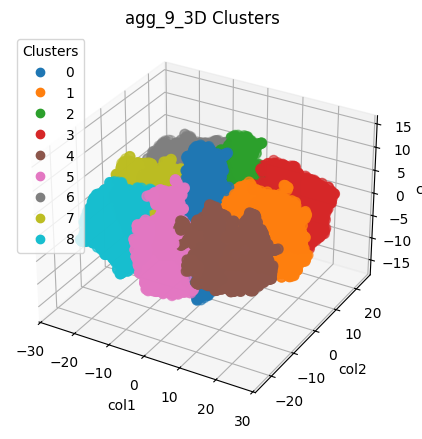

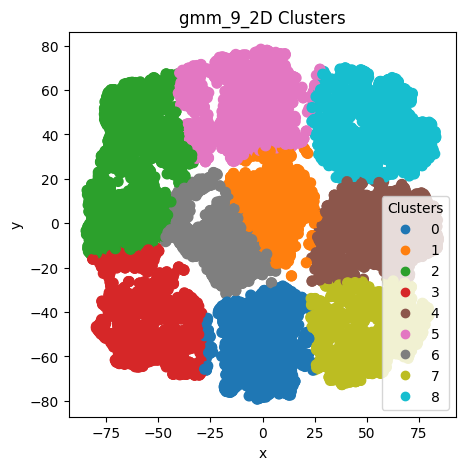

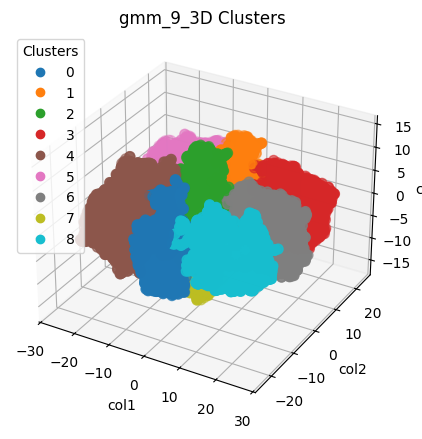

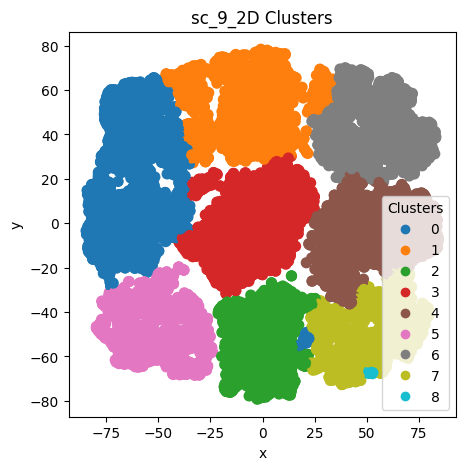

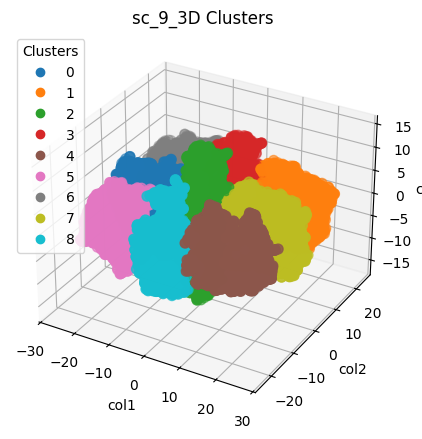

In [82]:
labels_log_list = [value for _, value in labels_log_tsne.items()]

for labels_log in labels_log_list:
    for key, value in labels_log.items():
        if key.endswith('_2D'):
            plot_clusters_col_2(tsne_X_data[0], value, f"{key} Clusters")
        else:
            plot_clusters_col_3(tsne_X_data[1], value, f"{key} Clusters")

In [83]:
eps_grid = np.linspace(0.01, 10.0, 50)
min_samples_grid = [3, 5, 7, 10, 15]

best = []
for min_samples in min_samples_grid:
    res = dbscan_eps_scan(tsne_X_data[0], eps_grid, min_samples=min_samples)
    # collect rows where number of clusters >= 2
    for eps, n_clusters, n_noise, frac_noise in res:
        best.append((min_samples, eps, n_clusters, frac_noise))
        print(f"min_samples={min_samples}, eps={eps:.3f}, clusters={n_clusters:2d}, frac_noise={frac_noise:.3f}")
    print()

min_samples=3, eps=0.010, clusters= 0, frac_noise=1.000
min_samples=3, eps=0.214, clusters=469, frac_noise=0.912
min_samples=3, eps=0.418, clusters=1871, frac_noise=0.594
min_samples=3, eps=0.622, clusters=2484, frac_noise=0.297
min_samples=3, eps=0.826, clusters=1990, frac_noise=0.135
min_samples=3, eps=1.029, clusters=1157, frac_noise=0.061
min_samples=3, eps=1.233, clusters=567, frac_noise=0.029
min_samples=3, eps=1.437, clusters=262, frac_noise=0.015
min_samples=3, eps=1.641, clusters=130, frac_noise=0.009
min_samples=3, eps=1.845, clusters=78, frac_noise=0.006
min_samples=3, eps=2.049, clusters=46, frac_noise=0.003
min_samples=3, eps=2.253, clusters=32, frac_noise=0.002
min_samples=3, eps=2.457, clusters=21, frac_noise=0.001
min_samples=3, eps=2.660, clusters=14, frac_noise=0.001
min_samples=3, eps=2.864, clusters=11, frac_noise=0.001
min_samples=3, eps=3.068, clusters=10, frac_noise=0.001
min_samples=3, eps=3.272, clusters= 5, frac_noise=0.001
min_samples=3, eps=3.476, clusters= 

In [84]:
search_cluster = [9]
find_result = []
for log in best:
    # print(log)
    if log[-2] in search_cluster:
        find_result.append(log)

find_result

[(5, 2.660408163265306, 9, 0.0022727272727272726),
 (15, 3.068163265306122, 9, 0.007167832167832168)]

In [85]:
eps_grid = np.linspace(0.01, 100.0, 25)
min_samples_grid = [3, 5, 7, 10, 15]

best = []
for min_samples in min_samples_grid:
    res = dbscan_eps_scan(tsne_X_data[1], eps_grid, min_samples=min_samples)
    # collect rows where number of clusters >= 2
    for eps, n_clusters, n_noise, frac_noise in res:
        best.append((min_samples, eps, n_clusters, frac_noise))
        print(f"min_samples={min_samples}, eps={eps:.3f}, clusters={n_clusters:2d}, frac_noise={frac_noise:.3f}")
    print()

min_samples=3, eps=0.010, clusters= 0, frac_noise=1.000
min_samples=3, eps=4.176, clusters= 1, frac_noise=0.000
min_samples=3, eps=8.342, clusters= 1, frac_noise=0.000
min_samples=3, eps=12.509, clusters= 1, frac_noise=0.000
min_samples=3, eps=16.675, clusters= 1, frac_noise=0.000
min_samples=3, eps=20.841, clusters= 1, frac_noise=0.000
min_samples=3, eps=25.008, clusters= 1, frac_noise=0.000
min_samples=3, eps=29.174, clusters= 1, frac_noise=0.000
min_samples=3, eps=33.340, clusters= 1, frac_noise=0.000
min_samples=3, eps=37.506, clusters= 1, frac_noise=0.000
min_samples=3, eps=41.672, clusters= 1, frac_noise=0.000
min_samples=3, eps=45.839, clusters= 1, frac_noise=0.000
min_samples=3, eps=50.005, clusters= 1, frac_noise=0.000
min_samples=3, eps=54.171, clusters= 1, frac_noise=0.000
min_samples=3, eps=58.337, clusters= 1, frac_noise=0.000
min_samples=3, eps=62.504, clusters= 1, frac_noise=0.000
min_samples=3, eps=66.670, clusters= 1, frac_noise=0.000
min_samples=3, eps=70.836, cluster

In [86]:
search_cluster = [9]
find_result = []
for log in best:
    # print(log)
    if log[-2] in search_cluster:
        find_result.append(log)

find_result

[]

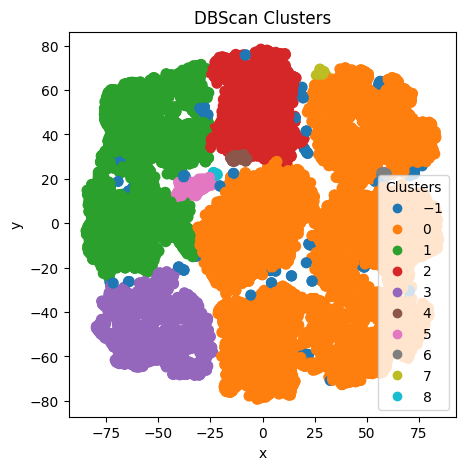

Number of clusters (excluding noise): 9
Davies-Bouldin Score: 2.2969
Silhouette Score: -0.1738


In [87]:
# DBSCAN
db = DBSCAN(eps=3.068163265306122, min_samples=15)  
labels_db = db.fit_predict(tsne_X_data[0])

plot_clusters_col_2(tsne_X_data[0], labels_db, "DBScan Clusters")


# Number of clusters (excluding noise)
n_clusters_ = len(set(labels_db)) - (1 if -1 in labels_db else 0)
print("Number of clusters (excluding noise):", n_clusters_)

# Only evaluate if at least 2 clusters
if n_clusters_ > 1:
    db_index = davies_bouldin_score(X, labels_db)
    ss_score = silhouette_score(X, labels_db)
    print(f"Davies-Bouldin Score: {db_index:.4f}")
    print(f"Silhouette Score: {ss_score:.4f}")
else:
    print("Not enough clusters for evaluation.")

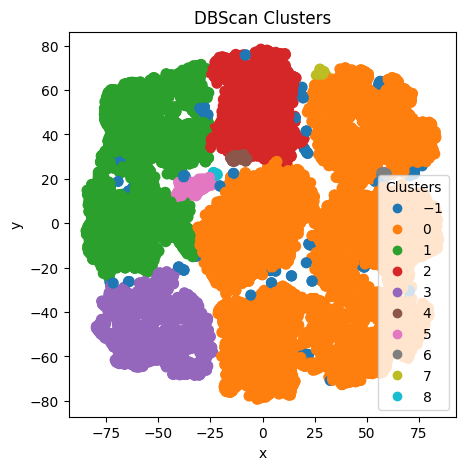

Number of clusters (excluding noise): 9
Davies-Bouldin Score: 2.2969
Silhouette Score: -0.1738


In [88]:
# DBSCAN
db_2 = DBSCAN(eps=2.660408163265306, min_samples=5)  
labels_db_2 = db.fit_predict(tsne_X_data[0])

plot_clusters_col_2(tsne_X_data[0], labels_db_2, "DBScan Clusters")

# Number of clusters (excluding noise)
n_clusters_ = len(set(labels_db)) - (1 if -1 in labels_db else 0)
print("Number of clusters (excluding noise):", n_clusters_)

# Only evaluate if at least 2 clusters
if n_clusters_ > 1:
    db_index = davies_bouldin_score(X, labels_db)
    ss_score = silhouette_score(X, labels_db)
    print(f"Davies-Bouldin Score: {db_index:.4f}")
    print(f"Silhouette Score: {ss_score:.4f}")
else:
    print("Not enough clusters for evaluation.")

### Overall Model Evaluation Scores

| Model              | Davies-Bouldin Score | Silhouette Score |
|---------------------|----------------------|------------------|
| kmean              | 1.2116               | 0.2552           |
| agg_3              | 1.2611               | 0.1931           |
| DBscan             | 6.3637               | -0.2157          |
| GMM                | 19.2937              | -0.0945          |
| SC                 | 1.1920               | 0.2501           |
| kmean_10_pca       | 4.6873               | 0.0172           |
| kmean_10_reduced   | 1.9709               | 0.0810           |
| kmean_10_reduced45 | 2.7336               | 0.0438           |
| agg_10_pca         | 7.4963               | -0.0084          |
| agg_10_reduced     | 2.7513               | 0.0075           |
| agg_10_reduced45   | 4.3079               | -0.0074          |
| gmm_10_pca         | 4.6899               | 0.0047           |
| gmm_10_reduced     | 3.3497               | -0.0270          |
| gmm_10_reduced45   | 5.2576               | 0.0036           |
| sc_10_pca          | 4.5807               | 0.0120           |
| sc_10_reduced      | 2.0801               | 0.0654           |
| sc_10_reduced45    | 2.8672               | 0.0338           |
| kmean_15_pca       | 4.3431               | 0.0188           |
| kmean_15_reduced   | 1.8087               | 0.0846           |
| kmean_15_reduced45 | 2.4880               | 0.0449           |
| agg_15_pca         | 6.8153               | -0.0117          |
| agg_15_reduced     | 2.6334               | -0.0015          |
| agg_15_reduced45   | 4.1349               | -0.0099          |
| gmm_15_pca         | 4.9661               | 0.0130           |
| gmm_15_reduced     | 2.3954               | 0.0026           |
| gmm_15_reduced45   | 3.8952               | -0.0251          |
| sc_15_pca          | 4.4599               | 0.0105           |
| sc_15_reduced      | 2.2415               | 0.0513           |
| sc_15_reduced45    | 2.6419               | 0.0334           |
| kmean_9_2D         | 0.7743               | 0.4057           |
| kmean_9_3D         | 0.9554               | 0.3398           |
| agg_9_2D           | 0.7281               | 0.3965           |
| agg_9_3D           | 1.0704               | 0.3216           |
| gmm_9_2D           | 0.7857               | 0.4013           |
| gmm_9_3D           | 0.9713               | 0.3159           |
| sc_9_2D            | 0.8087               | 0.3590           |
| sc_9_3D            | 1.0655               | 0.3263           |
| DBSCAN_tsne        | 2.2969               | -0.1738          |
| DBSCAN_tsne_2      | 2.2969               | -0.1738          |



## Using clustering to develop personalized prevention & treatment plans

### 1. From clusters -> actionable clinical groups

1. Map clusters to phenotypes/outcomes.
   - Link each cluster (from your PCA/t-SNE + clustering pipeline) to clinical labels or outcomes (disease vs control, severity, progression, response to therapy).
   - If a cluster is enriched for a poor outcome, label it a “high-risk” cluster; if enriched for favorable outcomes label it “low-risk” or “resilient.”

2. Characterize cluster markers.
   - Use PCA loadings and cluster-specific feature summaries (mean, median, distribution) to identify the top markers that differentiate each cluster.
   - Produce ranked marker lists per cluster (e.g., Marker A, Marker B, Marker Z) with effect sizes.

3. Define risk strata and subtypes.
   - Convert clusters into clinically-meaningful strata (e.g., high/medium/low risk) or biologically-distinct subtypes (Subtype A: inflammatory signature; Subtype B: metabolic signature).

### 2. Design prevention and treatment pathways per cluster
For each cluster/subtype define:
- Surveillance & prevention: frequency of monitoring, recommended tests, lifestyle/behavioral interventions and counseling (e.g., more frequent screening for high-risk clusters; dietary/exercise interventions for metabolic subtype).
- Pharmacologic approach: prioritize therapies likely to benefit that cluster (e.g., anti-inflammatory agents for inflammation-driven cluster), or avoid therapies unlikely to help.
- Referral & multidisciplinary care: e.g., genetic counseling, cardiology referral, psychiatry, or social work depending on cluster-associated risks.
- Clinical trial matching: match patients to trials targeting the molecular profile of their cluster.
- Tailored communication: adjust risk communication style and level of detail to patient preference and cluster risk.

### 3. Implementation workflow (practical steps)
1. Validation: internal cross-validation, hold-out cohorts, and external validation on independent datasets.
2. Clinical interpretability: reduce to a small panel of markers (top 5–10) for routine testing if possible.
3. Decision rules: create simple decision trees or scoring rules that map marker values -> cluster assignment -> recommended action.
4. Pilot & feedback: run a prospective pilot in a small clinical cohort, collect outcomes, iterate.
5. Monitoring: continuous performance monitoring (calibration, drift detection) and re-training schedule.

### 4. Limitations to communicate with clinicians/patients
- Clustering is descriptive — it finds similarity but not causation.
- Results depend on preprocessing (scaling, PCA, t-SNE parameters) and clustering hyperparameters.
- Some clusters may be artifacts (batch effects, technical confounders), require careful validation.
- Low silhouette scores or high Davies–Bouldin indicate weak separation; use caution interpreting such clusters.


## Ethical implications of using genetic data for risk profiling
### 1. Privacy & confidentiality

Risks
- Genetic data is uniquely identifying and immutably sensitive (can implicate relatives).
- Re-identification risk increases when genetic data is combined with phenotypic or demographic metadata.

Safeguards
- Store genetic data encrypted at rest; use access controls and fine-grained auditing.
- De-identify data and follow best practices (separate identifiers from genomic data; limit metadata sharing).
- Consider differential privacy or secure multi-party computation for research sharing where appropriate.

### 2. Consent & autonomy

Risks
- Participants may not fully understand future use of their genomic data (broad consent concerns).
- Unexpected findings and incidental results pose consent/return-of-results challenges.

Safeguards
- Use tiered informed consent: allow participants to choose what uses they permit (research only; clinical return of actionable findings; data sharing).
- Make consent documents clear about clustering/risk-profiling use, potential recontact, and data sharing.
- Provide options to withdraw and clear info about what withdrawal means in practice (e.g., already-shared derivatives may persist).

### 3. Fairness, bias & representativeness

Risks
- Clusters derived from an unrepresentative dataset can embed and amplify population bias (e.g., underrepresent minorities -> inaccurate risk predictions for them).
- Marker associations may be confounded by population structure (ancestry), socioeconomic status, or batch effects.

Safeguards
- Test model/cluster performance across subgroups (ancestry, age, sex, socioeconomic strata).
- If performance differs, avoid deploying one-size-fits-all rules; create subgroup-specific models or withhold deployment until equitable performance is achieved.
- Explicitly report dataset composition and limitations in any clinical decision support.

### 4. Discrimination & misuse

Risks
- Genetic risk profiles could be used by third parties (insurers, employers) to discriminate.
- Family members could be involuntarily affected by an individual’s genomic data being shared.

Safeguards
- Limit access to clinical teams with legitimate need; do not share identifiable genetic risk data with insurers/employers.
- Advocate for/legal compliance with anti-discrimination laws (e.g., GINA in the U.S.; note: local laws vary).
- Use data-sharing agreements that prohibit attempts at re-identification or discriminatory use.

### 5. Transparency & explainability

Risks
- Black-box clustering + complex marker panels may be hard to explain to patients/clinicians -> poor informed decision-making.

Safeguards
- Publish the marker panel and a simple explanation of how cluster-to-risk mapping was derived.
- Provide clinicians with decision aids and one-page summaries per cluster (top markers, suggested actions, uncertainty).
- If possible, reduce to sparse, interpretable marker sets for clinical use.

### 6. Return of results & recontact

Considerations
- Decide policy for returning actionable findings (e.g., highly penetrant pathogenic variants).
- Plan for recontact when new clinically important knowledge emerges.

Safeguards
- Have a multidisciplinary governance board (clinicians, genetic counselors, ethicists, patient reps) to decide return policies.
- Offer pre- and post-test genetic counseling for participants receiving personal results.

### 7. Governance, oversight & accountability
- Use institutional review boards/ethics committees for study approval.
- Maintain an independent audit trail and data governance board.
- Require data use agreements and monitor compliance.


### Practical checklist before clinical deployment
1. Validate clusters on independent cohorts.
2. Test model performance across demographic/ancestral groups.
3. Produce interpretable marker panel (smallest set that preserves performance).
4. Draft patient-facing materials & clinician decision aids.
5. Obtain tiered informed consent and enable withdrawal.
6. Encrypt data, log access, and limit sharing.
7. Create policy for return of results and recontact.
8. Ensure legal/regulatory compliance and anti-discrimination safeguards.
9. Start with supervised pilot, collect feedback, iterate.
